# Extra Exploration on AI_GP24 Group Enceladus
#### Mitchell Jackson, 1607912

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

class PDWorld_env:
    def __init__(self, num_agents, grid_size, num_pickups, num_drops, num_blocks, alpha, gamma, epsilon):
        
        self.grid_size = grid_size
        self.num_agents = num_agents
        self.num_pickups = num_pickups
        self.num_dropoffs = num_drops
        self.num_blocks = num_blocks
        self.state_size = self.grid_size ** 2
        self.action_size = 6 # Up, Down, Left, Right, Pickup, Dropoff
        self.q_tables = [{} for _ in range(self.num_agents)]  # Q-table for each agent, list of dicts
        self.alpha = alpha
        self.gamma = gamma
        self.epsilon = epsilon
        self.agents = []
        self.dropoffs = []
        self.pickups = []
        self.step_count = 0
        self.agent_radius = 0
        self.radius_cost = 0
        self.rng_seed = np.random.randint(999)
        
        # ADDED VIZ THINGS
        self.agent_start_pos = []
        self.action_count = np.zeros((self.grid_size, self.grid_size, self.action_size))
        self.agent_grids = []

    def get_q_tables(self):
        return self.q_tables
    
    def get_agents(self):
        return self.agents
    
    # For reproducing initial conditions
    def set_rng_seed(self, seed):
        self.rng_seed = seed
        return self.get_state
    
    # STATES include: all agent positions, each agent's carrying status, remaining boxes on each pickup point, boxes on each dropoff point
    # NOT INCLUDING: dropoff/pickup positions, and thus which remaining boxes are where
    def get_state(self):
        # Return the current state of the environment as a string
        agent_positions = '.'.join([f'{x},{y}' for x, y in self.agents])
        agent_carry_flags = '.'+'.'.join(['1' if carrying else '0' for carrying in self.carries_block])
        
        pickup_remaining_flags = '.'
        for (x, y) in self.pickups:
            pickup_remaining_flags += str(self.blocks_on_ground[(x,y)])
            
        dropoff_box_count = '.'
        for (x, y) in self.dropoffs:
            dropoff_box_count += str(self.blocks_on_ground[(x,y)])
        
        return agent_positions + agent_carry_flags + pickup_remaining_flags + dropoff_box_count
    
    def reset(self):
        
        np.random.seed(self.rng_seed)
        
        self.step_count = 0
        self.agents = [(0,0)] * self.num_agents
        self.pickups = [(0,0)] * self.num_pickups
        self.dropoffs = [(0,0)] * self.num_dropoffs
        self.agent_start_pos = [(0,0)] * self.num_agents
        
        # For tracking agent travel
        self.agent_grids = [np.zeros((self.grid_size, self.grid_size)) for _ in range(self.grid_size)]
        
        #assign random starting positions to agents
        start_pos_assigned = False
        for i in range(self.num_agents):
            start_pos_assigned = False
            while(start_pos_assigned == False):
                x, y = np.random.randint(0, self.grid_size), np.random.randint(0, self.grid_size)
                if((x,y) not in self.agents):
                    self.agents[i] = (x,y)
                    start_pos_assigned = True
                    # Record Start Positions for visualizations
                    self.agent_start_pos[i] = (x, y)
                    print("Agent Start (x,y): " + str(self.agent_start_pos[i]))
        
        #assign random starting positions to pickups (can overlap with agents)
        start_pos_assigned = False
        for i in range(self.num_pickups):
            start_pos_assigned = False
            while(start_pos_assigned == False):
                x, y = np.random.randint(0, self.grid_size), np.random.randint(0, self.grid_size)
                if((x,y) not in self.pickups):
                    self.pickups[i] = (x,y)
                    start_pos_assigned = True
                    
        #assign random starting positions to dropoffs (can overlap with agents but NOT pickups)
        start_pos_assigned = False
        for i in range(self.num_dropoffs):
            start_pos_assigned = False
            while(start_pos_assigned == False):
                x, y = np.random.randint(0, self.grid_size), np.random.randint(0, self.grid_size)
                if((x,y) not in self.dropoffs and (x,y) not in self.pickups):
                    self.dropoffs[i] = (x,y)
                    start_pos_assigned = True
        
        # list for keeping track of agents carrying blocks
        self.carries_block = [False] * self.num_agents
        
        
        
        #list of each cell with the number of blocks on the cell included
        self.blocks_on_ground = {(x, y): self.num_blocks if (x, y) in self.pickups else 0 for x in range(self.grid_size) for y in range(self.grid_size)}
        return self.get_state()
    
    def get_agent_grid(self, agent_id):
        return self.agent_grids[agent_id]
    
    # The below was just for testing
    def change_pickup_spots(self):
        self.pickups = [(4, 2), (3, 3), (2, 4)]  # Pickup spots
        self.blocks_on_ground = {(x, y): 4 if (x, y) in self.pickups else 0 for x in range(self.grid_size) for y in range(self.grid_size)}

    # Below are the 3 policies 
    def prandom(self):
        actions = [0 for _ in range(self.num_agents)]
        for i in range(self.num_agents):
            x, y = self.agents[i]
            if (x, y) in self.pickups and self.blocks_on_ground[(x,y)] > 0 and (not self.carries_block[i]):
                    actions[i] = 4
            elif (x, y) in self.dropoffs and self.carries_block[i] and self.blocks_on_ground[(x,y)] < ((self.num_blocks * self.num_pickups) / self.num_dropoffs) + 1:
                actions[i] = 5
            else:
                actions[i] = np.random.randint(0, self.action_size - 2)
        return self.step(actions)
    
    def pgreedy(self):
        actions = [0 for _ in range(self.num_agents)]
        for i in range(self.num_agents):
            x, y = self.agents[i]
            if (x, y) in self.pickups and self.blocks_on_ground[(x,y)] > 0 and (not self.carries_block[i]):
                    actions[i] = 4
            elif (x, y) in self.dropoffs and self.carries_block[i] and self.blocks_on_ground[(x,y)] < ((self.num_blocks * self.num_pickups) / self.num_dropoffs) + 1:
                actions[i] = 5
            else:
                key = self.get_state()
                
                q_values = self.get_q_values(i, key)[:4]
                
                best_actions = np.where(q_values == np.max(q_values))[0]
                # Break any tie
                actions[i] = np.random.choice(best_actions)
        return self.step(actions)
    
    def pxploit(self):
        actions = [0 for _ in range(self.num_agents)]
        #set seed for reproducability
        decide = np.random.default_rng()
        for i in range(self.num_agents):
            x, y = self.agents[i]
            if (x, y) in self.pickups and self.blocks_on_ground[(x,y)] > 0 and (not self.carries_block[i]):
                actions[i] = 4
            elif (x, y) in self.dropoffs and self.carries_block[i] and self.blocks_on_ground[(x,y)] < ((self.num_blocks * self.num_pickups) / self.num_dropoffs) + 1:
                actions[i] = 5
            else:
                #PXPLOIT random decision
                ep = decide.random()
                if(ep < self.epsilon):
                    return self.prandom()
                else:
                    key = self.get_state()
                    
                    q_values = self.get_q_values(i, key)
                    
                    best_actions = np.where(q_values == np.max(q_values))[0]
                    # Break any tie
                    actions[i] = np.random.choice(best_actions)
        return self.step(actions)
    
    # Did not end up properly implementing SARSA, as it messed with my visualizations.
    def pSARSA(self):
        actions = [0 for _ in range(self.num_agents)]
        #set seed for reproducability
        decide = np.random.default_rng()
        for i in range(self.num_agents):
            x, y = self.agents[i]
            if (x, y) in self.pickups and self.blocks_on_ground[(x,y)] > 0 and (not self.carries_block[i]):
                actions[i] = 4
            elif (x, y) in self.dropoffs and self.carries_block[i] and self.blocks_on_ground[(x,y)] < ((self.num_blocks * self.num_pickups) / self.num_dropoffs) + 1:
                actions[i] = 5
            else:
                #PXPLOIT random decision
                ep = decide.random()
                if(ep < self.epsilon):
                    return self.prandom()
                else:
                    key = self.get_state()
                    
                    q_values = self.get_q_values(i, key)
                    
                    best_actions = np.where(q_values == np.max(q_values))[0]
                    # Break any tie
                    actions[i] = np.random.choice(best_actions)
        return self.sarsa_step(actions)
    
    # def show_favorite_actions(self):
        grid = np.zeros((self.grid_size, self.grid_size))
        show_grid = np.zeros((self.grid_size, self.grid_size))
        #I am so sorry for this nasty loop
        max_count = 0
        max_act = 0
        for x in range(self.grid_size):
            for y in range(self.grid_size):
                max_count = 0
                max_act = 0
                for i in range(self.action_size):
                    if(self.action_count[(x,y)][i] > max_count):
                        max_count = self.action_count[(x,y)][i]
                        max_act = i
                grid[x,y] = max_act
        
        for pickup in self.pickups:
            show_grid[pickup] = 2
            
        for dropoff in self.dropoffs:
            show_grid[dropoff] = 3
        
        plt.imshow(show_grid, cmap='RdBu', interpolation='nearest')
        
        for x in range(self.grid_size):
            for y in range(self.grid_size):
                if grid[x,y] == 0:
                    #Weird flip required
                    plt.text(y, x, r'$\uparrow$', ha="center")
                elif grid[x,y] == 1:
                    plt.text(y, x, r'$\downarrow$', ha="center")
                elif grid[x,y] == 2:
                    plt.text(y, x, r'$\leftarrow$', ha="center")
                elif grid[x,y] == 3:
                    plt.text(y, x, r'$\rightarrow$', ha="center")
                elif grid[x,y] == 4:
                    plt.text(y, x, r'PICK', ha="center")
                elif grid[x,y] == 5:
                    plt.text(y, x, r'DROP', ha="center")
        
        plt.title("Favorite Actions")
        plt.show()
    
    
    # Perform actions and calculate rewards
    # GRIDS USE ROW,COL Coords
    def step(self, actions):

        # Reset reward to 0 for current step
        reward = 0
        state = self.get_state()
        self.step_count += 1
        
        
        self.step_cost = 1
        self.pick_reward = 10
        self.drop_reward = 10
                
        for i in range(self.num_agents):
            x, y = self.agents[i]  # Extract x and y coordinates

            # I actually think these are not quite UDLR, but the algorithm works nonetheless, just labeled wrong, as plt uses ROW,COL
            if actions[i] == 0 and all((x, y - 1) != agent for agent in self.agents):  # Up
                if y > 0:
                    self.agents[i] = (x, y - 1)
                    reward -= self.step_cost
            # Adding "collision detection": add negative reward for trying to move off the board
            if actions[i] == 0 and y == 0:
                reward -= 3

            elif actions[i] == 1 and all((x, y + 1) != agent for agent in self.agents):  # Down
                if y < self.grid_size - 1:
                    self.agents[i] = (x, y + 1)
                    reward -= self.step_cost
            # Adding "collision detection"
            if actions[i] == 1 and y == self.grid_size - 1:
                reward -= 3

            elif actions[i] == 2 and all((x - 1, y) != agent for agent in self.agents):  # Left
                if x > 0:
                    self.agents[i] = (x - 1, y)
                    reward -= self.step_cost
            # Adding "collision detection"
            if actions[i] == 2 and x == 0:
                reward -= 3

            elif actions[i] == 3 and all((x + 1, y) != agent for agent in self.agents):  # Right
                if x < self.grid_size - 1:
                    self.agents[i] = (x + 1, y)
                    reward -= self.step_cost
            # Adding "collision detection"
            if actions[i] == 3 and x == self.grid_size - 1:
                reward -= 3
            
            elif actions[i] == 4:  # Pick up
                # Pick up block if at pick-up spot, block not already picked up, and there is at least one block
                if ((x, y) in self.pickups and self.blocks_on_ground[(x, y)] > 0 and not self.carries_block[i]):
                    reward += self.pick_reward  # Add reward for picking up block

                    self.blocks_on_ground[(x, y)] -= 1  # Remove 1 block from the pickup cell
                    
                    self.carries_block[i] = True # Set agent[i] to carry a block
                    # print("PICKUP")

            elif actions[i] == 5:  # Drop off
                # Drop off passenger if at drop-off spot, passenger picked up, agent carries a block, and dropoff cell has less than max blocks
                # ((self.num_blocks * self.num_pickups) / self.num_dropoffs) + 1 ensures that each dropoff can hold enough blocks, even with few dropoff points.
                # Conversely, if there are many dropoff points, they will each only hold a few blocks
                 
                if (x, y) in self.dropoffs and self.carries_block[i] and self.blocks_on_ground[(x,y)] < ((self.num_blocks * self.num_pickups) / self.num_dropoffs) + 1:
                    reward += self.drop_reward
                    
                    self.blocks_on_ground[(x, y)] += 1  # Place block on the dropoff cell
                    self.carries_block[i] = False  # Update agent's state to not carrying a block                    
                    # print("DROPOFF")
            
            # Added optional reward for not being near another agent
            radius = self.agent_radius  # set reward radius to 1/10th the grid size
            # Going to use manhattan distance, so it's not really a radius
            if(radius > 0):
                for j in range(self.num_agents):
                    if( j != i):
                        # if manhattan distance less than radius, negative reward
                        if (abs(self.agents[i][0] - self.agents[j][0]) + abs(self.agents[i][1] - self.agents[j][1]) < radius):
                            reward -= self.radius_cost
            
            
            # Record chosen action in action_count cell
            self.action_count[(x, y)][actions[i]] += 1
            
            # "Heat-map" stuff, add .01 to the current cell for tracking travel
            self.agent_grids[i][(x,y)] += 0.01
            
            # Call update_q_table after all actions have been taken
            self.update_q_table(i, state, actions[i], reward, self.get_state())
        
        return self.get_state()
    
    # The below is for altering the detection radius and negative reward for agent avoidance
    def set_radius(self, radius, cost):
        self.agent_radius = radius
        self.radius_cost = cost
        return self.get_state()
    
    def sarsa_step(self, actions):

        self.step_count += 1
        reward = 0
        state = self.get_state()

                
        for i in range(self.num_agents):
            x, y = self.agents[i]  # Extract x and y coordinates

            if actions[i] == 0 and all((x, y - 1) != agent for agent in self.agents):  # Up
                if y > 0:
                    self.agents[i] = (x, y - 1)
                    reward -= 1
            # Adding "collision detection"
            if actions[i] == 0 and y == 0:
                reward -= 3

            elif actions[i] == 1 and all((x, y + 1) != agent for agent in self.agents):  # Down
                if y < self.grid_size - 1:
                    self.agents[i] = (x, y + 1)
                    reward -= 1
            # Adding "collision detection"
            if actions[i] == 1 and y == self.grid_size - 1:
                reward -= 3

            elif actions[i] == 2 and all((x - 1, y) != agent for agent in self.agents):  # Left
                if x > 0:
                    self.agents[i] = (x - 1, y)
                    reward -= 1
            # Adding "collision detection"
            if actions[i] == 2 and x == 0:
                reward -= 3

            elif actions[i] == 3 and all((x + 1, y) != agent for agent in self.agents):  # Right
                if x < self.grid_size - 1:
                    self.agents[i] = (x + 1, y)
                    reward -= 1
            # Adding "collision detection"
            if actions[i] == 3 and x == self.grid_size - 1:
                reward -= 3
            
            elif actions[i] == 4:  # Pick up
                # Pick up block if at pick-up spot, block not already picked up, and there is at least one block
                if ((x, y) in self.pickups and self.blocks_on_ground[(x, y)] > 0 and not self.carries_block[i]):
                    reward += 7  # Add reward for picking up block

                    self.blocks_on_ground[(x, y)] -= 1  # Remove 1 block from the pickup cell
                    
                    self.carries_block[i] = True # Set agent[i] to carry a block
                    # print("PIKUP")

            elif actions[i] == 5:  # Drop off
                # Drop off passenger if at drop-off spot, passenger picked up, agent carries a block, and dropoff cell has less than max blocks
                if (x, y) in self.dropoffs and self.carries_block[i] and self.blocks_on_ground[(x,y)] < ((self.num_blocks * self.num_pickups) / self.num_dropoffs) + 1:
                    reward += 7
                    
                    self.blocks_on_ground[(x, y)] += 1  # Place block on the dropoff cell
                    self.carries_block[i] = False  # Update agent's state to not carrying a block                    
                    # print("DROPOFF")
            
            # Record chosen action in cell
            self.action_count[(x, y)][actions[i]] += 1
            # Record individual heat-map type stuff, just mark that we have been here
            self.agent_grids[i][(x,y)] += 0.01
            
            # Call update_q_table after all action has been taken
            self.update_q_table_SARSA(i, state, actions[i], reward, self.get_state())

        return self.get_state()
    
    def update_q_table(self, agent_id, state, action, reward, next_state):
            # Get Q-values for the current state
            key = state
            q_values = self.q_tables[agent_id].setdefault(key, np.zeros(self.action_size))
            # Get the maximum Q-value for the next state
            key_next = next_state
            next_q_values = self.q_tables[agent_id].setdefault(key_next, np.zeros(self.action_size))
            max_next_q_value = np.max(next_q_values)
            # Update Q-value for the taken action
            q_values[action] += self.alpha * (reward + self.gamma * max_next_q_value - q_values[action])
    
    # The below is to examine the next Q(S, A) without acutally stepping
    # All SARSA algos require tweaking to allow for visualization
    def sarsa_xploit(self, agent_id, state):
        action = 0
        #set seed for reproducability
        decide = np.random.default_rng()
        x, y = self.agents[agent_id]
        if (x, y) in self.pickups and self.blocks_on_ground[(x,y)] > 0 and (not self.carries_block[agent_id]):
            action = 4
        elif (x, y) in self.dropoffs and self.carries_block[agent_id] and self.blocks_on_ground[(x,y)] < 4:
            action = 5
        else:
            #PXPLOIT random decision
            ep = decide.random()
            if(ep < self.epsilon):
                return np.random.randint(0, self.action_size - 2)
            else:
                key = state
                
                q_values = self.get_q_values(agent_id, key)
                
                best_actions = np.where(q_values == np.max(q_values))[0]
                # Break any tie
                action = np.random.choice(best_actions)
        return action
    
    def update_q_table_SARSA(self, agent_id, state, action, reward, next_state):
            # Get Q-values for the current state
            key = state
            q_values = self.q_tables[agent_id].setdefault(key, np.zeros(self.action_size))
            # Get the maximum Q-value for the next state
            key_next = next_state
            next_q_values = self.q_tables[agent_id].setdefault(key_next, np.zeros(self.action_size))
            
            # DO NOT JUST TAKE MAX FOR SARSA:
                # max_next_q_value = np.max(next_q_values)
            # For SARSA we actually apply the policy to the next state, instead of taking max q-val
            # Minimal Difference
            # Update Q-value for the taken action
            q_values[action] += self.alpha * (reward + self.gamma * next_q_values[self.sarsa_xploit(agent_id, next)] - q_values[action])       
    
    # Returns the q-values for an agent, state pair, or creates a q-table for the new state
    def get_q_values(self, agent_id, state):
        return self.q_tables[agent_id].setdefault(state, np.zeros(self.action_size))
    
    def is_done(self):
        
        # All Pickups empty
        all_pickups_empty = all(self.blocks_on_ground[(x,y)] == 0 for (x,y) in self.pickups)

        # All agents not-carry
        none_carrying = all(self.carries_block[i] == 0 for i in range(self.num_agents))

        episode_done = none_carrying and all_pickups_empty

        return episode_done


# Visualization Code

In [2]:
#Visualizations
import matplotlib.pyplot as plt

# env_T = PDWorld_env(0.3, 3, 0.5, 0.2)
# env_T.reset()


# This is MASSIVELY inefficient. Works. But is clunky. I wish I knew how to put it in GPU
def viz_MVP_grid(env = PDWorld_env):
    q_tables = env.get_q_tables()
    
    num_agents = env.num_agents
    grid_size = env.grid_size
    
    # grids is for recording the max 
    grids = [np.zeros((grid_size, grid_size, 6)) for _ in range(num_agents)]
    
    #go through EVERY q_table
    for q_table in q_tables:
        # AND EVERY STATE IN THEM
        for state in q_table:
            
            agents = [[0,0] for _ in range(num_agents)]
            
            state_chunks = state.split(".")
            # Split the string by '.' and get the first element
            
            # Record the positions of agents from THIS state only
            for a in range(num_agents):
                xy_list = state_chunks[a].split(",")
                x_y = [int(part) for part in xy_list]
                agents[a] = x_y

            # Add the q-val for each action to grids[agent][x,y] to get a running cumulative value
            for a in range(num_agents):
                for i in range(6):
                    grids[a][agents[a][0]][agents[a][1]][i] += q_table[state][i]
    
    # The below is for recording the max cumulative q-valued action for each cell for each agent - makes a grid of favorite actions
    # Used for "Favorite Actions"           
    arrows = [np.zeros((grid_size, grid_size)) for _ in range(num_agents)]
    for a in range(num_agents):
        cumu_q_val = 0
        for i in range(grid_size):
            for j in range(grid_size):
                if((j, i) in env.dropoffs or (j, i) in env.pickups):
                    arrows[a][i,j] = np.argmax(grids[a][j,i])
                else:
                    arrows[a][i,j] = np.argmax(grids[a][j,i][:4])
                cumu_q_val += arrows[a][j,i]
        
        # The below records the average MAX CUMU action value across the whole grids[agent]
        avg_cell_val = cumu_q_val / grid_size ** 2
        print("Avg cell value: " + str(a) + ": " + str(avg_cell_val))
        
        #set cells with less than the average traversal to be 1 lower than lowest q-val, to show gradient of only frequented cells
        agent_grid = env.get_agent_grid(a)

        # This essentially gives the (number of steps) * 0.01, check env class 
        travel_total = 0
        for i in range(grid_size):
            for j in range(grid_size):
                travel_total += agent_grid[i, j]
        
        # Below finds the average number of steps on any cell
        travel_avg = travel_total / grid_size ** 2
        # Going through the grid, if the 
        for i in range(grid_size):
                for j in range(grid_size):
                    if(agent_grid[i,j] < travel_avg):
                        arrows[a][i,j] = -1
    
    # The below does essentially the same thing but with a slightly different metric, so we can see an actual gradient instead of
    # Just a grid of favorite actions.
    # Used for "Q_Max Map"
    q_max_map = [np.zeros((grid_size, grid_size)) for _ in range(num_agents)]
    for a in range(num_agents):
        
        for i in range(grid_size):
            for j in range(grid_size):
                if((j, i) in env.dropoffs or (j, i) in env.pickups):
                    q_max_map[a][i,j] = np.max(grids[a][j,i])
                else:
                    q_max_map[a][i,j] = np.max(grids[a][j,i][:4])
                cumu_q_val += q_max_map[a][j,i]
        
        #set cells with less than the average traversal to be 1 lower than lowest q-val, to show gradient of only frequented cells
        agent_grid = env.get_agent_grid(a)

        travel_total = 0
        for i in range(grid_size):
            for j in range(grid_size):
                travel_total += agent_grid[i, j]
        
        travel_avg = travel_total / grid_size ** 2
        q_min = np.min(q_max_map[a])
        for i in range(grid_size):
            for j in range(grid_size):
                if(agent_grid[i,j] < travel_avg):
                    q_max_map[a][i,j] = q_min - 1
    
    # Cells set to -1 or MIN - 1 turn black
    print("Black spaces indicate very little traffic in that cell for the agent")
    # Add text to Favorite Actions
    for a in range(num_agents):
        for x in range(env.grid_size):
            for y in range(env.grid_size):
                if arrows[a][x,y] == 0:
                    #Weird flip required
                    plt.text(y, x, r'$\uparrow$', fontsize=4, ha="center", va="center")
                elif arrows[a][x,y] == 1:
                    plt.text(y, x, r'$\downarrow$', fontsize=4, ha="center", va="center")
                elif arrows[a][x,y] == 2:
                    plt.text(y, x, r'$\leftarrow$', fontsize=4, ha="center", va="center")
                elif arrows[a][x,y] == 3:
                    plt.text(y, x, r'$\rightarrow$', fontsize=4, ha="center", va="center")
                elif arrows[a][x,y] == 4:
                    plt.text(y, x, r'P', ha="center", fontsize=7, va="center", color="Green")
                elif arrows[a][x,y] == 5:
                    plt.text(y, x, r'D', ha="center", fontsize=7, va="center", color="Red")
                elif arrows[a][x,y] == -1:
                    plt.text(y, x, r' ', ha="center", fontsize=4, va="center")
        
        plt.title("Favorite Actions Agent " + str(a + 1))
        plt.imshow(arrows[a], cmap="gray")
        plt.show()
        
        plt.title("Q_max Map: Agent " + str(a + 1))
        plt.imshow(q_max_map[a], cmap="inferno")
        # Colorbar shows the gradient key
        plt.colorbar()
        plt.show()

# The below shows the "heatmap" for agent travel
def show_agent_grid(agent_id, env = PDWorld_env):
        
        # Get the agent's grid
        agent_grid = env.agent_grids[agent_id]

        # normalize the grid to [0,1]
        scaler = MinMaxScaler()
        scaled_grid = scaler.fit_transform(agent_grid)

        # Map the scaled values from [0, 1] to [-1, 1]
        normalized_grid = 2 * scaled_grid - 1

        # Plot the normalized grid
        plt.imshow(normalized_grid, cmap="RdBu", vmin=-1, vmax=1)
        
        for dropoff in env.dropoffs:
            plt.text(dropoff[0], dropoff[1], "D", ha="center", va="center")
        for pickup in env.pickups:
            plt.text(pickup[0], pickup[1], "P", ha="center", va="center")
            
        plt.title("Agent " + str(agent_id + 1) + "'s heatmap: blue:more::red:less")
        plt.colorbar()  # Add a colorbar to show the mapping of values
        plt.show()


# Adds together all the "heatmaps" to get an "avg" - should trend towards one avg value to give more white, less BR result
def show_agents_overlap(env = PDWorld_env):
    # Grid to hold cumulative
    grid = np.zeros((env.grid_size, env.grid_size))
    
    for agent_grid in env.agent_grids:
        
        # normalize the grid to [0,1]
        scaler = MinMaxScaler()
        scaled_grid = scaler.fit_transform(agent_grid)

        # Map the scaled values from [0, 1] to [-1, 1]
        normalized_grid = 2 * scaled_grid - 1   
        grid += normalized_grid
    
    # Show added heatmap
    plt.imshow(grid, cmap="RdBu")
    
    start_pos = env.agent_start_pos 
    
    # Add text for dropoffs, pickups, and agents' start_pos
    for dropoff in env.dropoffs:
        plt.text(dropoff[0], dropoff[1], "D", ha="center", va="center")
    for pickup in env.pickups:
        plt.text(pickup[0], pickup[1], "P", ha="center", va="center")
    for i in range(env.num_agents):
        plt.text(start_pos[i][1], start_pos[i][0], str(i + 1), ha="center", va="center")
    print("Cumulative for all agents:")
    print("White means a balance of agents who frequent the block and those that dont")
    print("Red means infrequently visited, Blue means visited much")
    print("Red will always occur where there is little reward to be found")
    print("Ideally, there will be Red with White, with minimal Blue on major shared pathways")
    print("Too much Blue indicates excessive agent overlap, ideally there are White attractive paths with Blue cores, or just a few Blue hotspots")
    plt.title("Agent Overlap")
    plt.show()

# Just shows a grid with the agent start positions 
def show_start_pos(env = PDWorld_env):
    grid = np.zeros((env.grid_size, env.grid_size))
    
    start_pos = env.agent_start_pos   
    
    for i in range(env.num_agents):
        grid[start_pos[i][0], start_pos[i][1]] = 1
        plt.text(start_pos[i][1], start_pos[i][0], str(i + 1), size="small", ha="center", va="center")
        
    plt.imshow(grid, cmap='Set3', interpolation='nearest')
    plt.title("Agent Starting Positions")
    plt.show()

# Shows Block locations, amount in each cell
def show_block_locations(env = PDWorld_env):
    grid = np.zeros((env.grid_size, env.grid_size))
    show_grid = np.zeros((env.grid_size, env.grid_size))
    for x in range(env.grid_size):
        for y in range(env.grid_size):
            grid[x,y] = int(env.blocks_on_ground[x,y])
    
    for pickup in env.pickups:
        show_grid[pickup[1], pickup[0]] = 3
    
    for dropoff in env.dropoffs:
        show_grid[dropoff[1], dropoff[0]] = 7
    
    for x in range(env.grid_size):
        for y in range(env.grid_size):
            if(int(grid[x,y]) != 0):
                plt.text(x, y, str(int(grid[x,y])), size="small", ha="center", va="center")
    plt.imshow(show_grid, cmap='Pastel1', interpolation='nearest')
    
    plt.title("Block Locations: Pickup:Lilac | Dropoff Gray")
    plt.show()

# The below were used for the actual project submission, not all me
def visualize_world(agents, pickups, dropoffs, grid_size):
    grid = np.zeros((grid_size, grid_size))
    
    for agent in agents:
        grid[agent] = 1
    
    for pickup in pickups:
        grid[pickup] = 2
    
    for dropoff in dropoffs:
        grid[dropoff] = 3
    
    plt.imshow(grid, cmap='viridis', interpolation='nearest')
    plt.title("Pickup: Green,    Dropoff: Yellow")
    plt.show()
    
def visualize_world_sansAgents(env = PDWorld_env):
    grid_size = env.grid_size
    pickups = env.pickups
    dropoffs = env.dropoffs
    grid = np.zeros((grid_size, grid_size))
    
    # for agent in agents:
    #     grid[agent] = 1
    
    for pickup in pickups:
        grid[pickup] = 2
    
    for dropoff in dropoffs:
        grid[dropoff] = 3
    
    plt.imshow(grid, cmap='viridis', interpolation='nearest')
    plt.title("Pickup: Green,    Dropoff: Yellow")
    plt.show()

# Begin Experiments with above Q-Learning environment
### All Experiments have parameters:
- num_agents =  number of agents
- grid_size =   the environment is a (grid_size)x(grid_size) set of cells
- num_pickups = number of pickup cells
- num_drops =   number of dropoff cells
- num_blocks =  number of blocks per pickup cell
- alpha =       Learning Rate
- gamma =       Discount Rate
- epsilon =     Exploration Rate


There exist optional parameters radius, radius cost, and rng_seed
- env.set_radius(radius, cost) sets the radius within which another agent being present causes 'cost' to be subtracted from that step's reward
- env.set_rng_seed(seed) sets the rng seed for the positions generated to a set value (otherwise it is random), BUT this does not affect the PXPLOIT decisions, which are always randomized

#### Visualizations use a coordinate system (x,y) with all {x,y} > 0, but with top-left origin coordinates such that x is the vertical axis, and y is the horizontal axis.
This does not matter much, but was a hassle to get all the visuals to line up correctly.

## Experiments 1-2
### Experiment 1 has parameters:
- num_agents =  3
- grid_size =   50
- num_pickups = 5
- num_drops =   7
- num_blocks =  11
- alpha =       0.1
- gamma =       0.9
- epsilon =     0.1

Experiment 2 just runs for more steps


Agent Start (x,y): (39, 47)
Agent Start (x,y): (38, 23)
Agent Start (x,y): (49, 7)


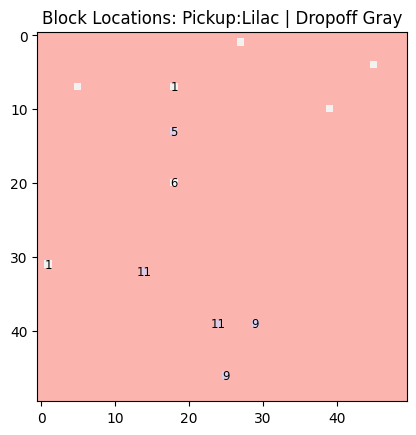

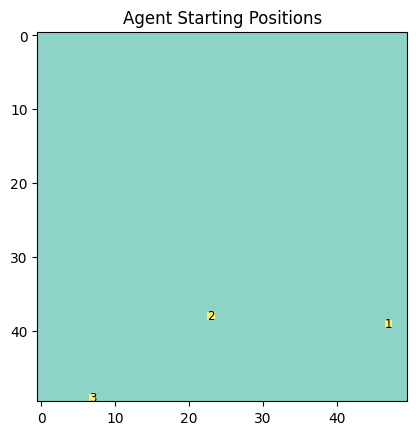

Avg cell value: 0: 0.4228
Avg cell value: 1: 0.4756
Avg cell value: 2: 0.2684
Black spaces indicate very little traffic in that cell for the agent


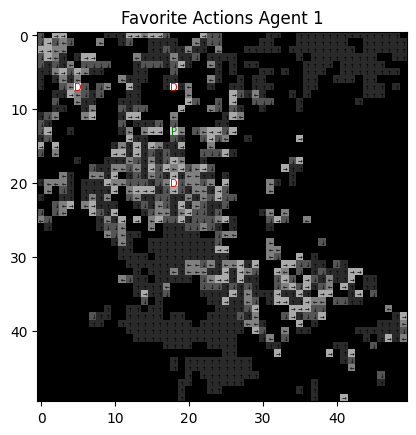

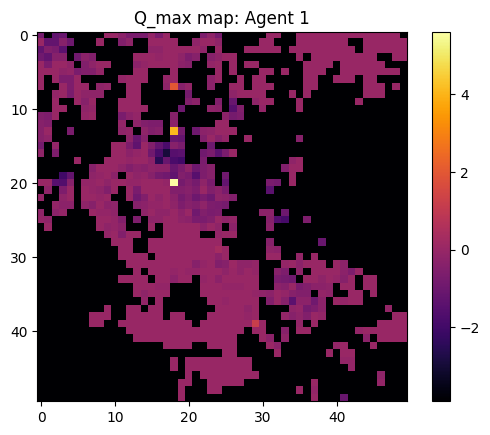

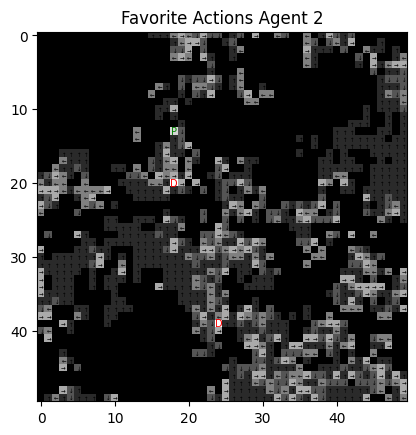

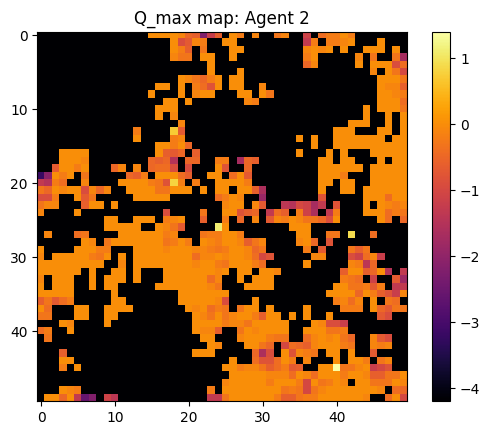

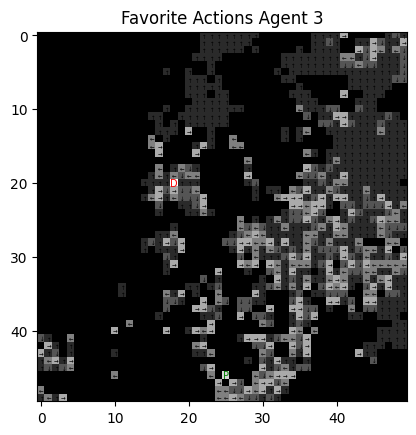

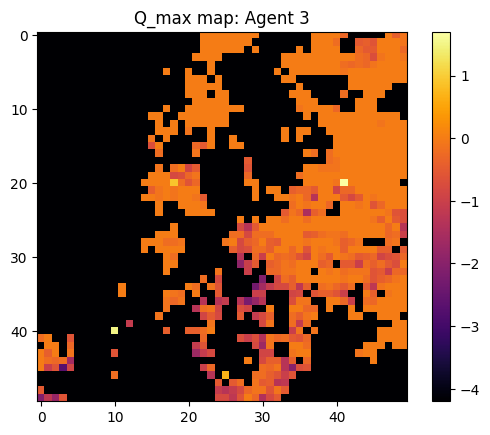

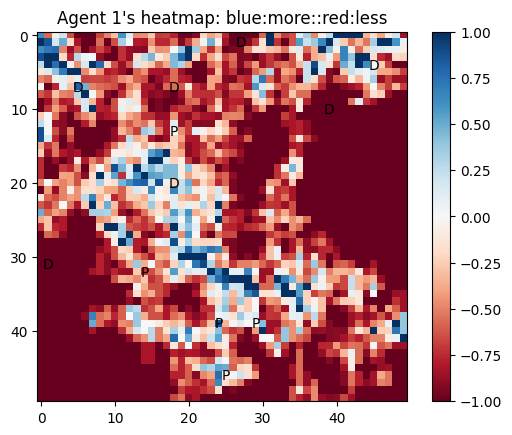

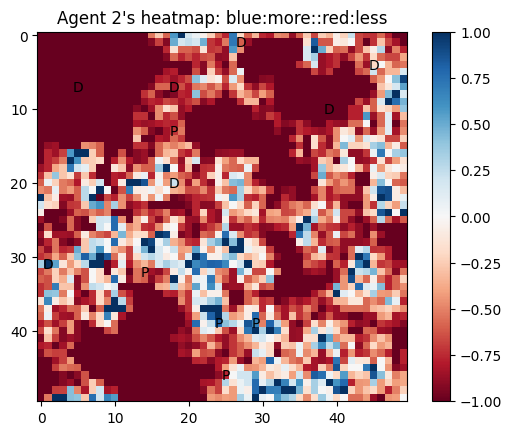

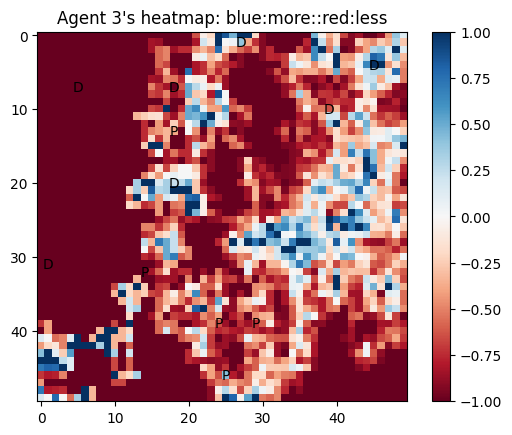

Cumulative for all agents:
White means a balance of agents who frequent the block and those that dont
Red means infrequently visited, Blue means visited much
Red will always occur where there is little reward to be found
Ideally, there will be Red with White, with minimal Blue on major shared pathways
Too much Blue indicates excessive agent overlap, ideally there are White attractive paths with Blue cores, or just a few Blue hotspots


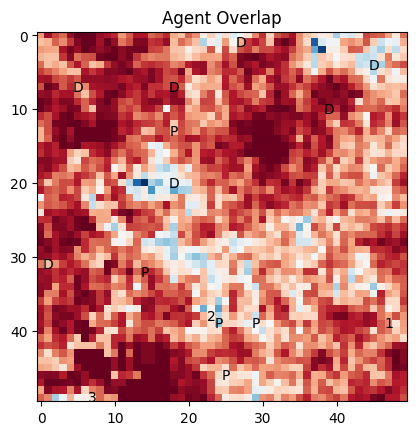

In [3]:
# Experiment 1 9999 steps pxploit
# Create an instance of PDWorld_env

env = PDWorld_env(3, 50, 5, 7, 11, 0.1, 0.9, 0.1)
# Reset the environment to initialize the state
# Set a fixed seed for reproducibility
env.set_rng_seed(777)
state = env.reset()

for step in range(9999):

    state = env.pxploit()
    # Check if the episode is done
    if env.is_done():
        print("Episode done at step", step + 1)
        break

show_block_locations(env)

show_start_pos(env)

viz_MVP_grid(env)

for i in range(env.num_agents):
    show_agent_grid(i, env)

show_agents_overlap(env)


Agent Start (x,y): (39, 47)
Agent Start (x,y): (38, 23)
Agent Start (x,y): (49, 7)


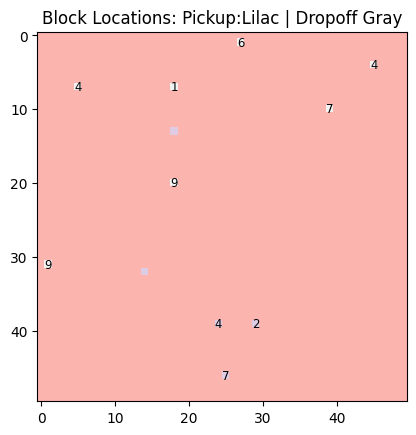

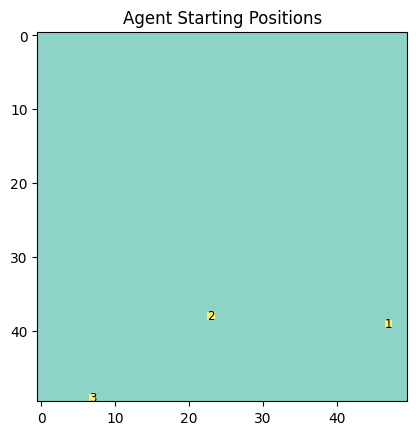

Avg cell value: 0: 0.7456
Avg cell value: 1: 0.7568
Avg cell value: 2: 0.7584
Black spaces indicate very little traffic in that cell for the agent


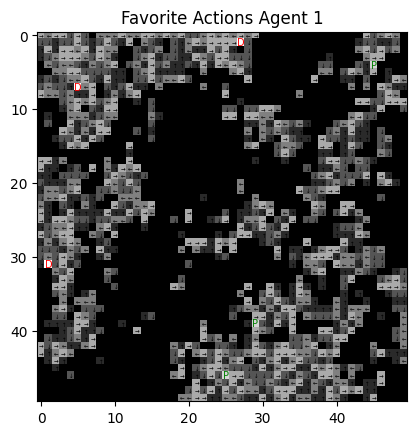

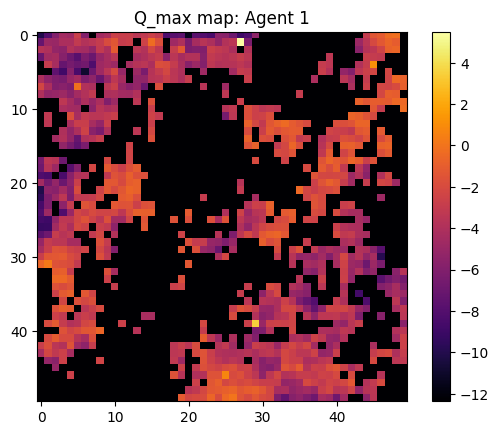

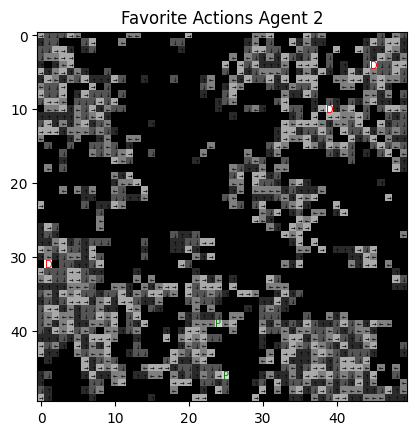

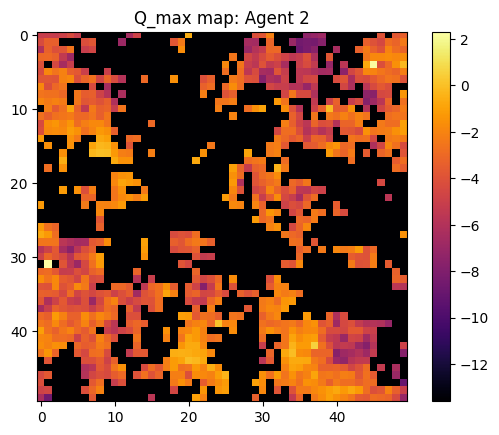

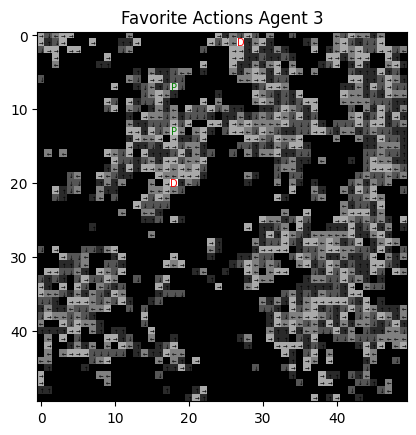

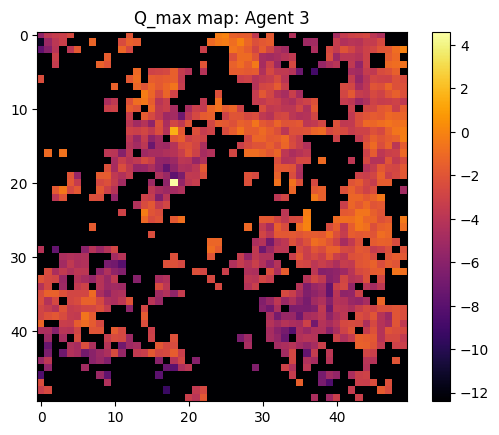

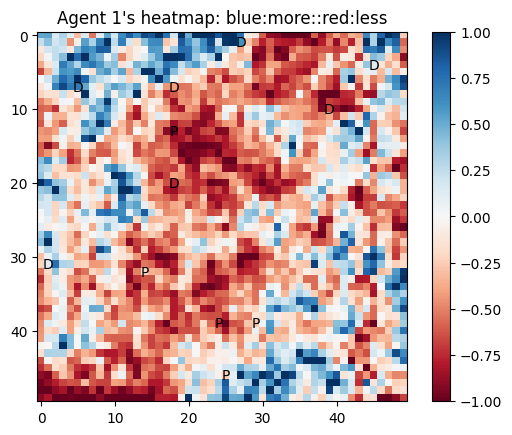

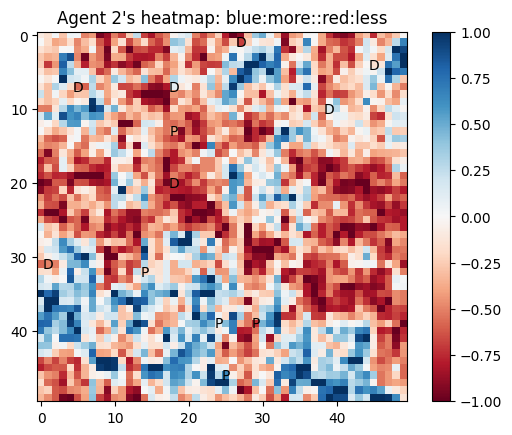

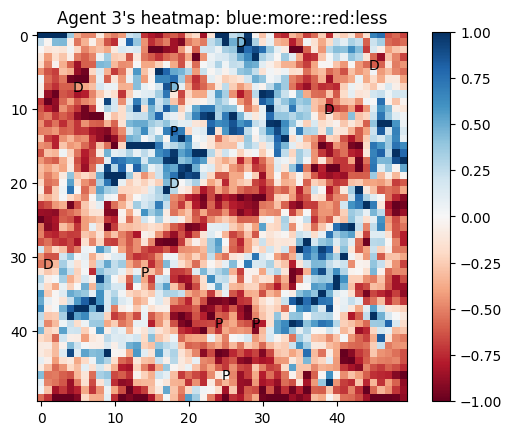

Cumulative for all agents:
White means a balance of agents who frequent the block and those that dont
Red means infrequently visited, Blue means visited much
Red will always occur where there is little reward to be found
Ideally, there will be Red with White, with minimal Blue on major shared pathways
Too much Blue indicates excessive agent overlap, ideally there are White attractive paths with Blue cores, or just a few Blue hotspots


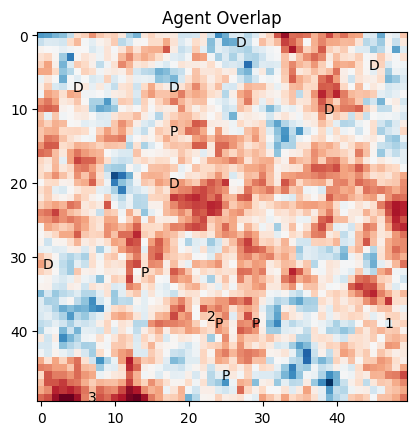

In [4]:
# Experiment 2, same but with 99999 steps
# Create an instance of PDWorld_env


env_2 = PDWorld_env(3, 50, 5, 7, 11, 0.1, 0.9, 0.1)
# Reset the environment to initialize the state
# Set a fixed seed for reproducibility
env_2.set_rng_seed(777)
state = env_2.reset()

for step in range(99999):

    state = env_2.pxploit()
    # Check if the episode is done
    if env_2.is_done():
        print("Episode done at step", step + 1)
        break

show_block_locations(env_2)

show_start_pos(env_2)

viz_MVP_grid(env_2)

for i in range(env_2.num_agents):
    show_agent_grid(i, env_2)

show_agents_overlap(env_2)


# Ex3, Ex4 alter the gamma and epsilon to more normal values, 0.95 and 0.05
Experiemnt 4 just runs for more steps

Agent Start (x,y): (39, 47)
Agent Start (x,y): (38, 23)
Agent Start (x,y): (49, 7)


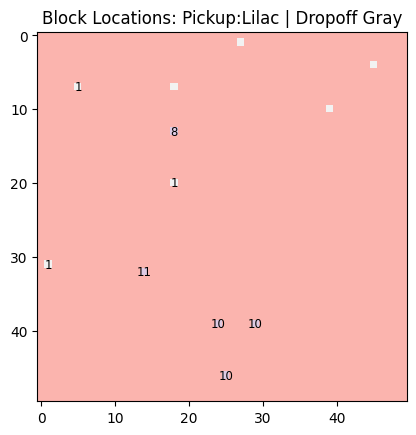

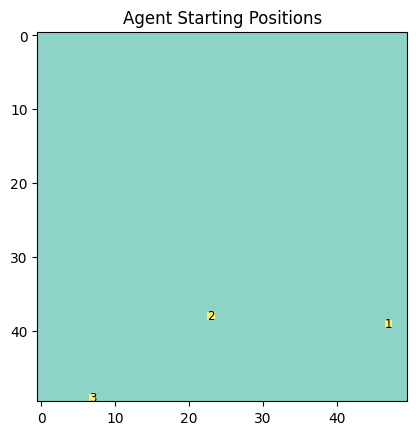

Avg cell value: 0: 0.3036
Avg cell value: 1: 0.354
Avg cell value: 2: 0.3812
Black spaces indicate very little traffic in that cell for the agent


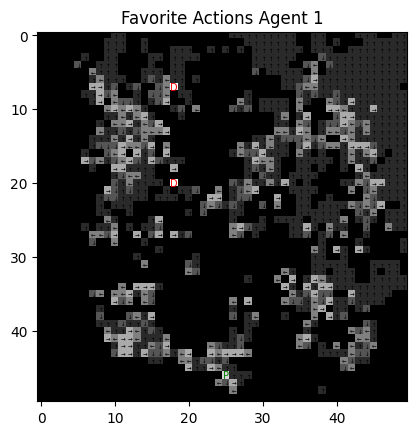

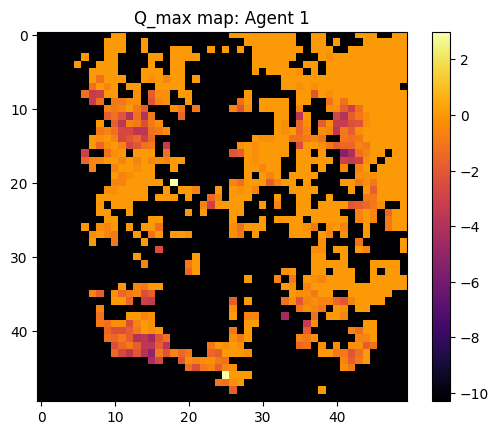

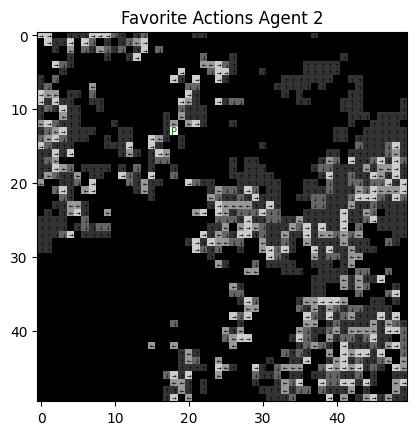

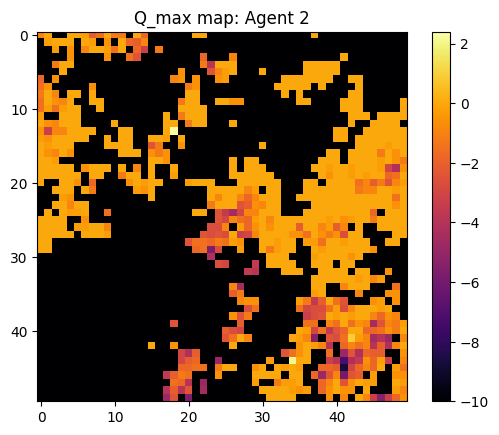

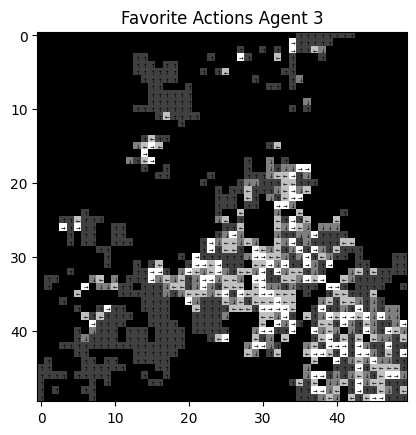

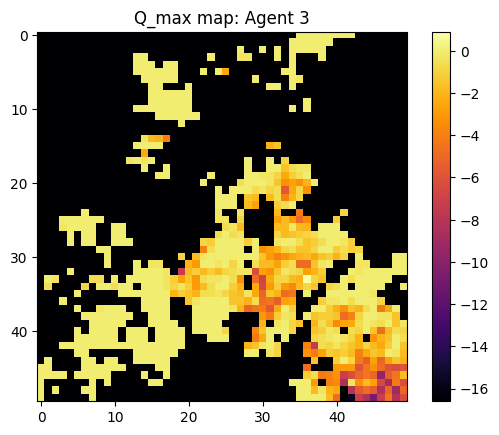

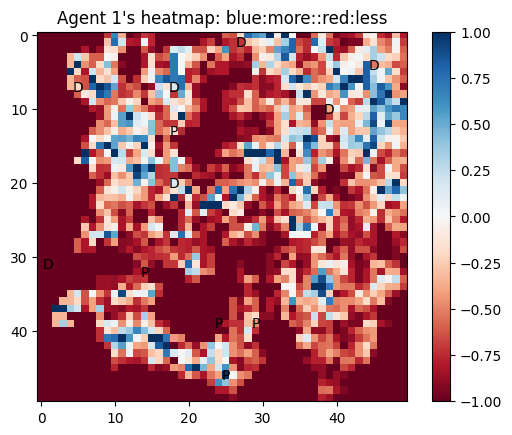

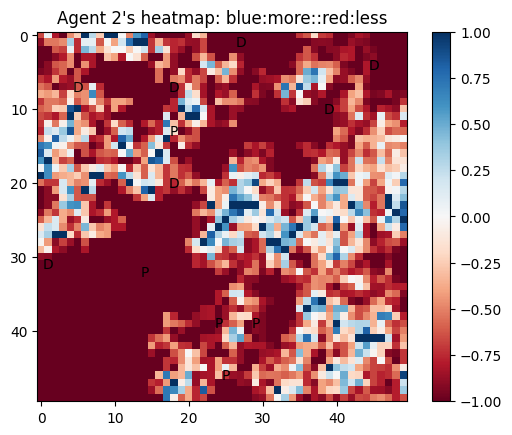

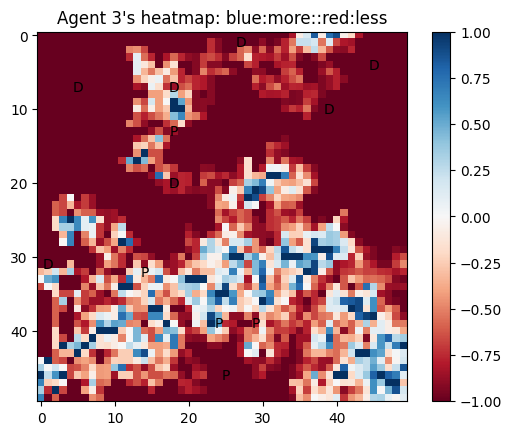

Cumulative for all agents:
White means a balance of agents who frequent the block and those that dont
Red means infrequently visited, Blue means visited much
Red will always occur where there is little reward to be found
Ideally, there will be Red with White, with minimal Blue on major shared pathways
Too much Blue indicates excessive agent overlap, ideally there are White attractive paths with Blue cores, or just a few Blue hotspots


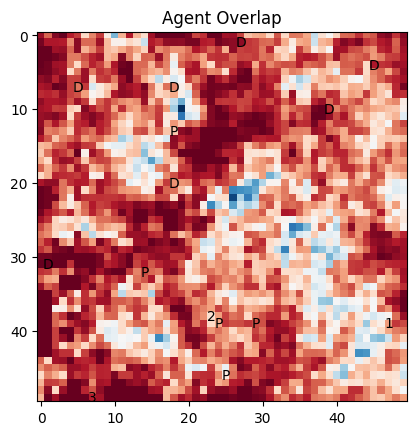

In [5]:
# Experiment 3 9999 steps pxploit 
# with alpha = 0.3,
# gamma = 0.95, 
# epsilon = 0.05
# Create an instance of PDWorld_env

# num_agents, grid_size, num_pickups, num_drops, num_blocks, alpha, gamma, epsilon
env_3 = PDWorld_env(3, 50, 5, 7, 11, 0.3, 0.95, 0.05)
# Reset the environment to initialize the state
# Set a fixed seed for reproducibility
env_3.set_rng_seed(777)
state = env_3.reset()

for step in range(9999):

    state = env_3.pxploit()
    # Check if the episode is done
    if env_3.is_done():
        print("Episode done at step", step + 1)
        break

show_block_locations(env_3)

show_start_pos(env_3)

viz_MVP_grid(env_3)
for i in range(env_3.num_agents):
    show_agent_grid(i, env_3)
    
show_agents_overlap(env_3)


Agent Start (x,y): (39, 47)
Agent Start (x,y): (38, 23)
Agent Start (x,y): (49, 7)


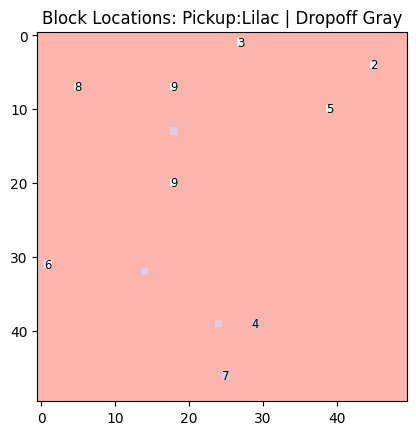

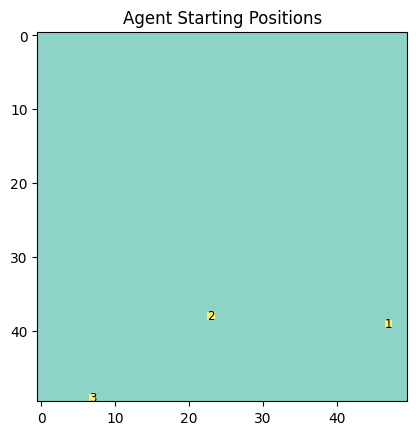

Avg cell value: 0: 0.7348
Avg cell value: 1: 0.7564
Avg cell value: 2: 0.7604
Black spaces indicate very little traffic in that cell for the agent


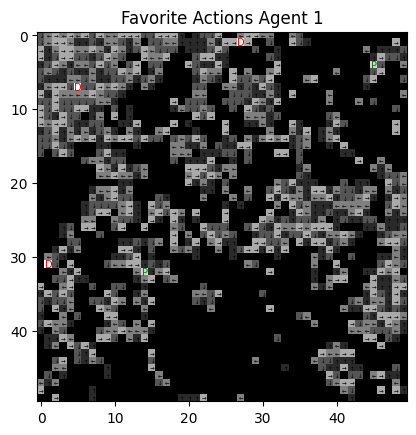

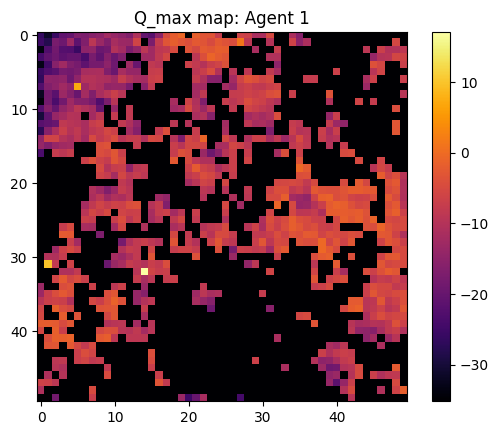

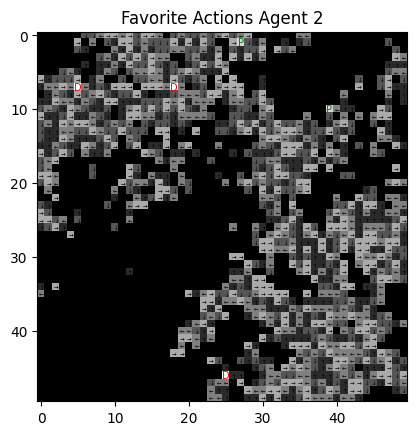

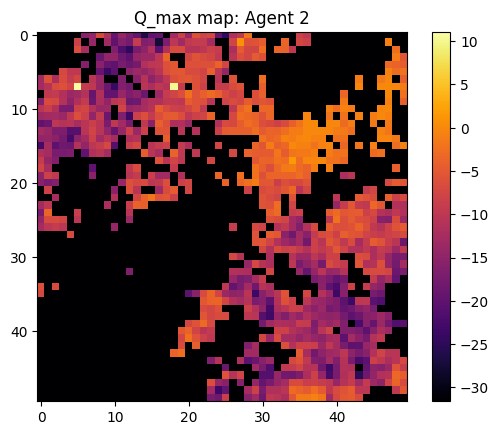

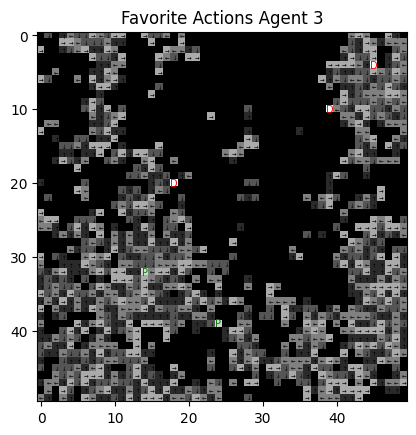

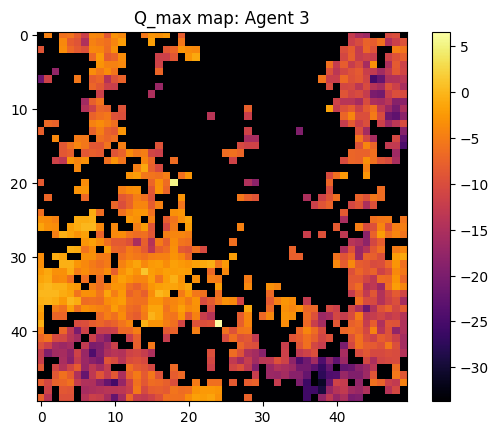

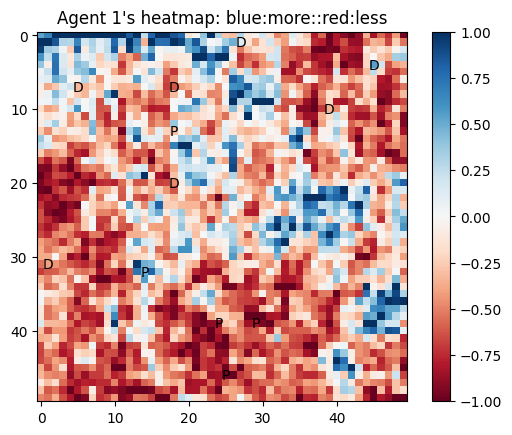

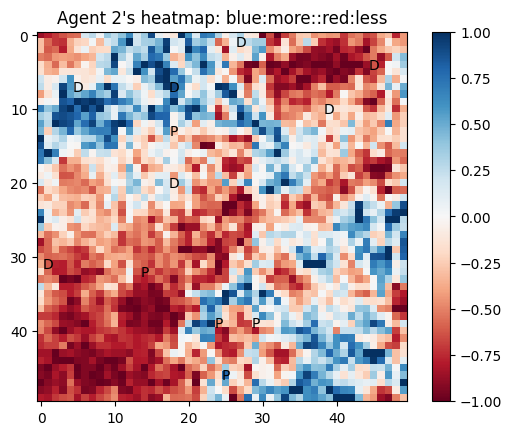

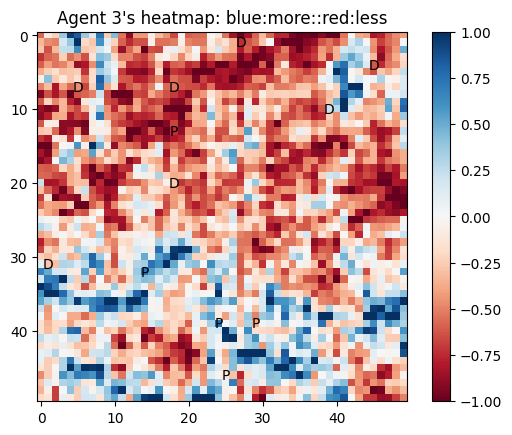

Cumulative for all agents:
White means a balance of agents who frequent the block and those that dont
Red means infrequently visited, Blue means visited much
Red will always occur where there is little reward to be found
Ideally, there will be Red with White, with minimal Blue on major shared pathways
Too much Blue indicates excessive agent overlap, ideally there are White attractive paths with Blue cores, or just a few Blue hotspots


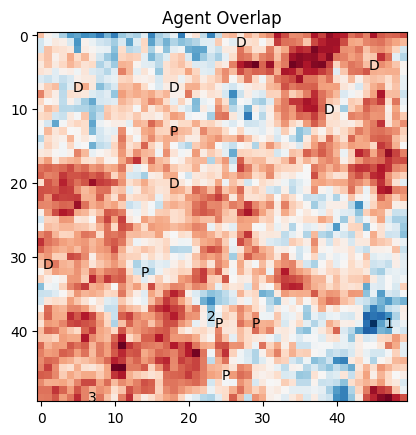

In [6]:
# Experiment 4, 99999 steps pxploit with 
# alpha = 0.3, 
# gamma = 0.95, 
# epsilon = 0.05
# Create an instance of PDWorld_env

# num_agents, grid_size, num_pickups, num_drops, num_blocks, alpha, gamma, epsilon
env_4 = PDWorld_env(3, 50, 5, 7, 11, 0.3, 0.95, 0.05)
# Reset the environment to initialize the state
# Set a fixed seed for reproducibility
env_4.set_rng_seed(777)
state = env_4.reset()

for step in range(99999):

    state = env_4.pxploit()
    # Check if the episode is done
    if env_4.is_done():
        print("Episode done at step", step + 1)
        break

show_block_locations(env_4)

show_start_pos(env_4)

viz_MVP_grid(env_4)
for i in range(env_4.num_agents):
    show_agent_grid(i, env_4)
    
show_agents_overlap(env_4)


# Ex5: Increase grid_size and num_agents

Agent Start (x,y): (47, 59)
Agent Start (x,y): (38, 87)
Agent Start (x,y): (49, 71)
Agent Start (x,y): (29, 39)
Agent Start (x,y): (89, 46)
Agent Start (x,y): (24, 39)
Agent Start (x,y): (18, 13)


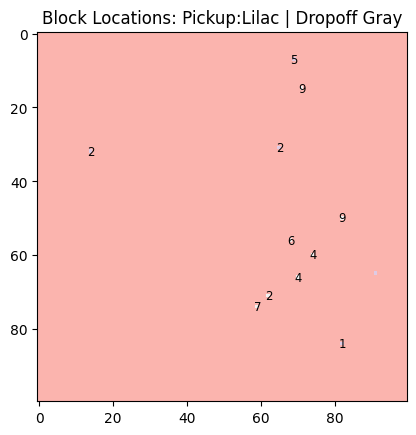

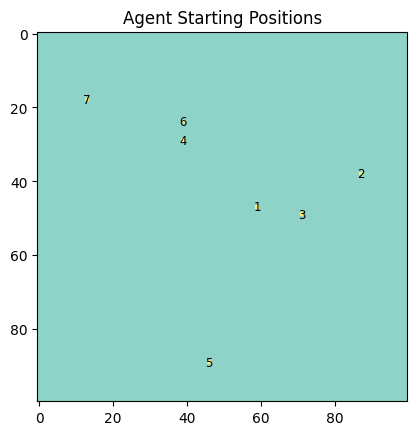

Avg cell value: 0: 0.6425
Avg cell value: 1: 0.6905
Avg cell value: 2: 0.6618
Avg cell value: 3: 0.5816
Avg cell value: 4: 0.6658
Avg cell value: 5: 0.4134
Avg cell value: 6: 0.6263
Black spaces indicate very little traffic in that cell for the agent


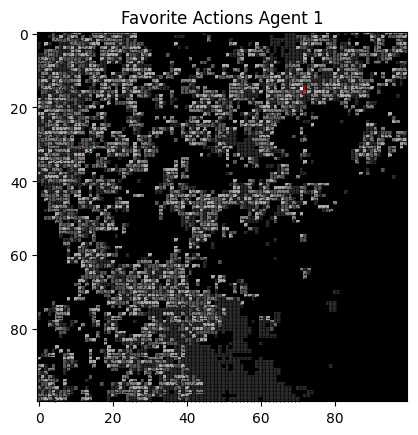

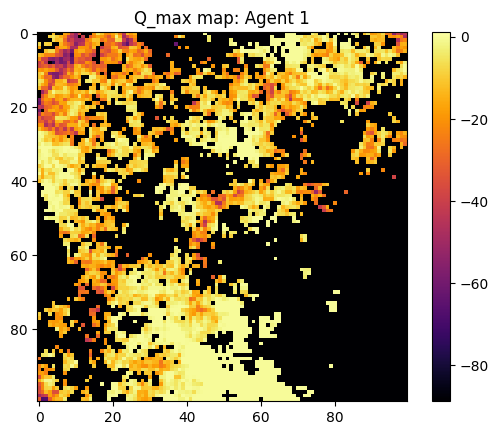

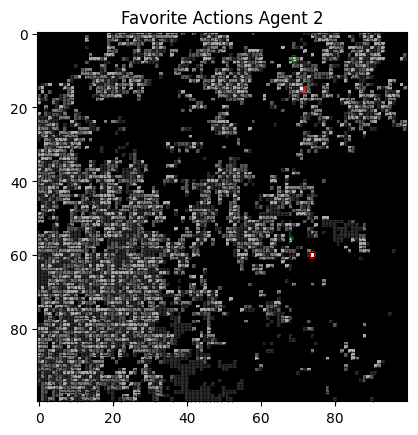

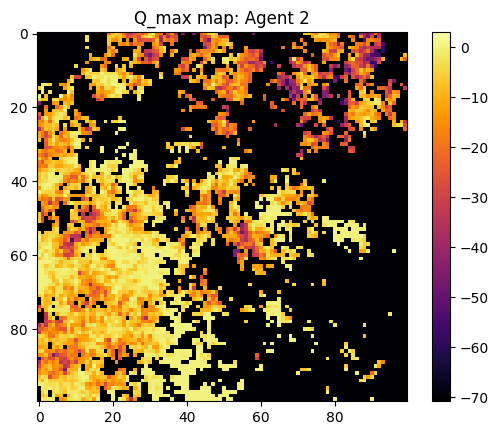

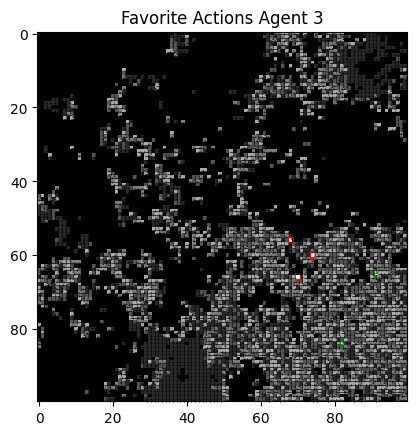

...

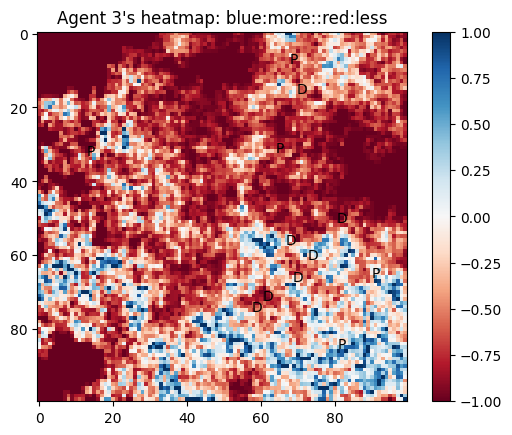

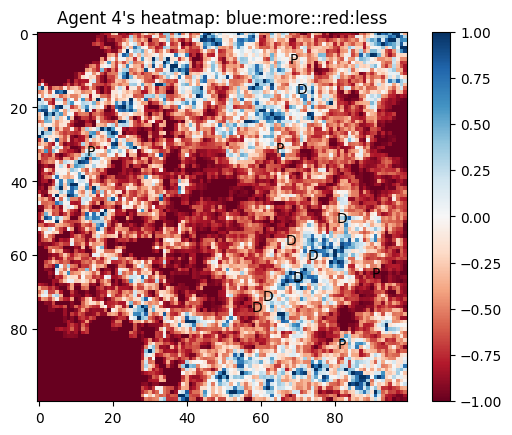

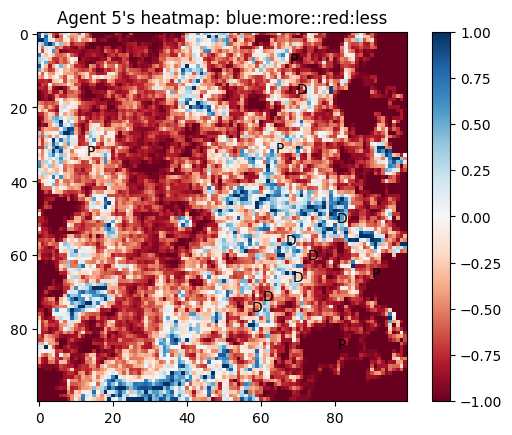

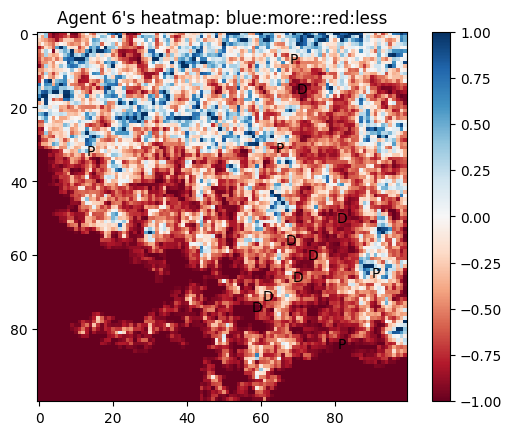

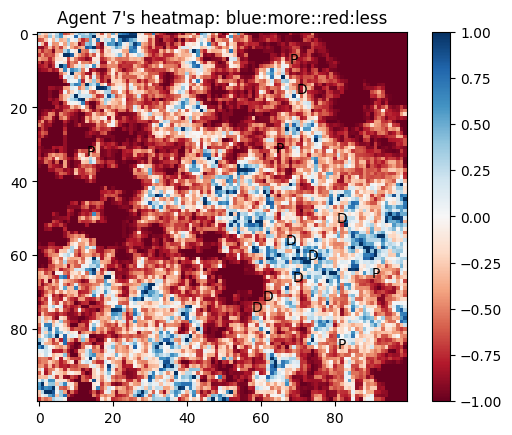

Cumulative for all agents:
White means a balance of agents who frequent the block and those that dont
Red means infrequently visited, Blue means visited much
Red will always occur where there is little reward to be found
Ideally, there will be Red with White, with minimal Blue on major shared pathways
Too much Blue indicates excessive agent overlap, ideally there are White attractive paths with Blue cores, or just a few Blue hotspots


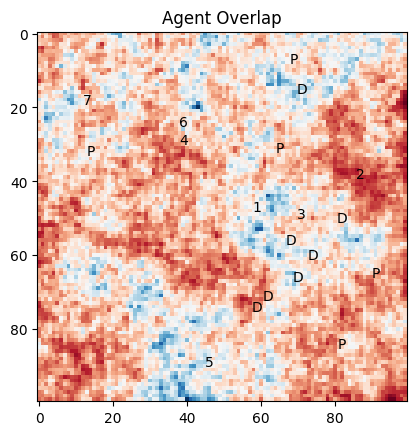

In [7]:
# Experiment 5, 99999 steps pxploit with 
# INCREASED
# alpha = 0.3, 
# gamma = 0.95, 
# epsilon = 0.05, 
# grid_size 100, 
# num_agents 7
# Create an instance of PDWorld_env


#This will take awhile
# num_agents, grid_size, num_pickups, num_drops, num_blocks, alpha, gamma, epsilon
env_5 = PDWorld_env(7, 100, 5, 7, 11, 0.3, 0.95, 0.05)
# Reset the environment to initialize the state
# Set a fixed seed for reproducibility
env_5.set_rng_seed(777)
state = env_5.reset()

for step in range(99999):

    state = env_5.pxploit()
    # Check if the episode is done
    if env_5.is_done():
        print("Episode done at step", step + 1)
        break

show_block_locations(env_5)

show_start_pos(env_5)

viz_MVP_grid(env_5)
for i in range(env_5.num_agents):
    show_agent_grid(i, env_5)
    
show_agents_overlap(env_5)


# Ex6: Below is me attempting to make the paths more exclusive
Experiment 6 has epsilon 0.01, so less incentive to explore

Agent Start (x,y): (47, 59)
Agent Start (x,y): (38, 87)
Agent Start (x,y): (49, 71)
Agent Start (x,y): (29, 39)
Agent Start (x,y): (89, 46)
Agent Start (x,y): (24, 39)
Agent Start (x,y): (18, 13)
Episode done at step 188813


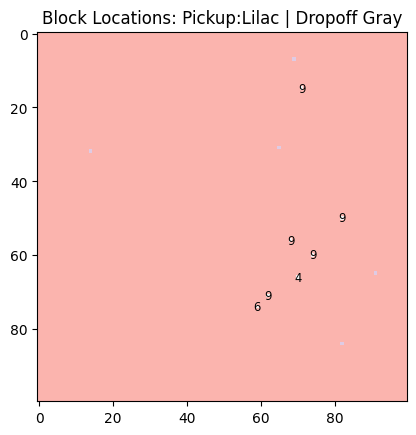

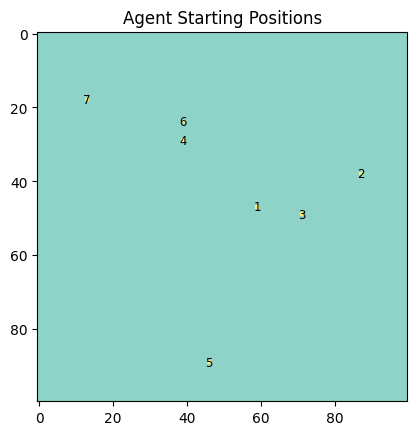

Avg cell value: 0: 0.7402
Avg cell value: 1: 0.7411
Avg cell value: 2: 0.7108
Avg cell value: 3: 0.67
Avg cell value: 4: 0.7388
Avg cell value: 5: 0.7486
Avg cell value: 6: 0.7581
Black spaces indicate very little traffic in that cell for the agent


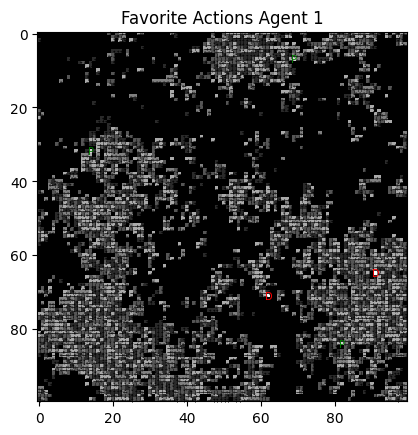

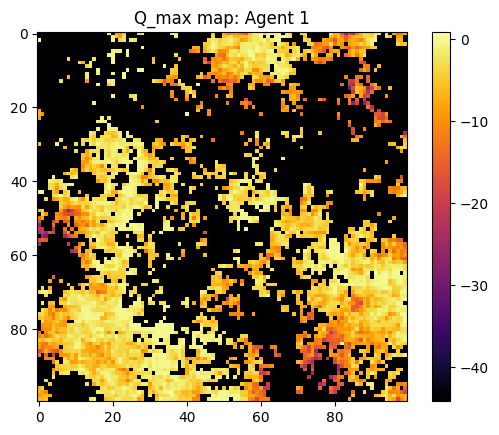

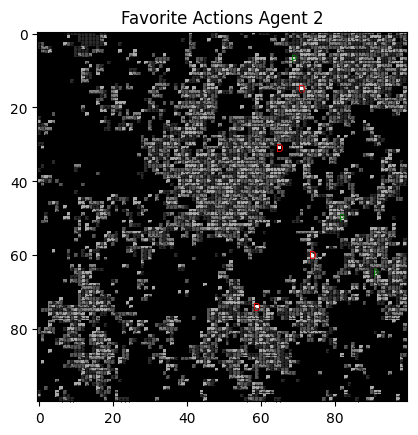

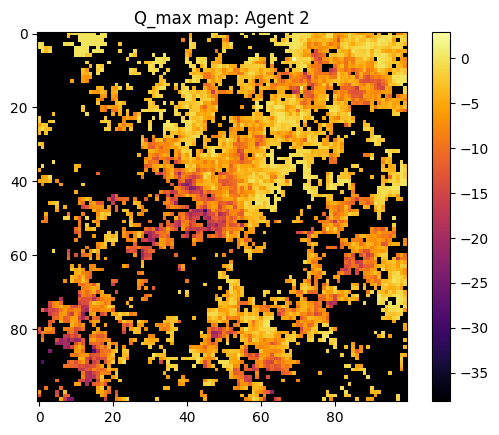

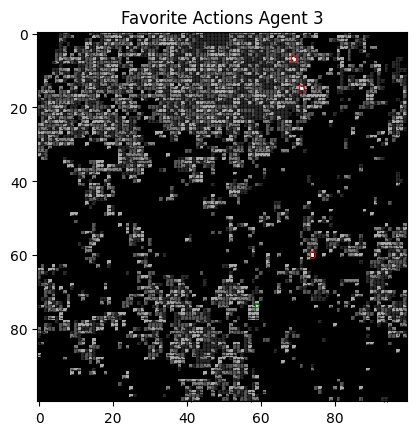

...

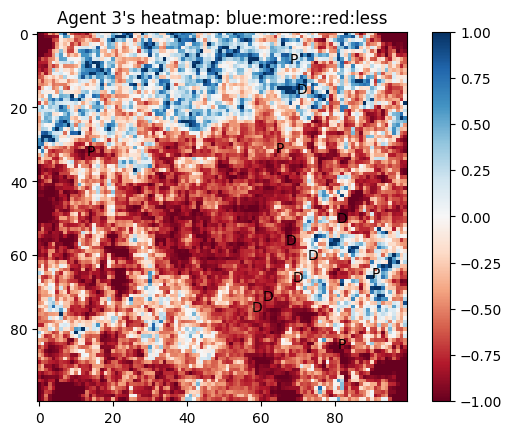

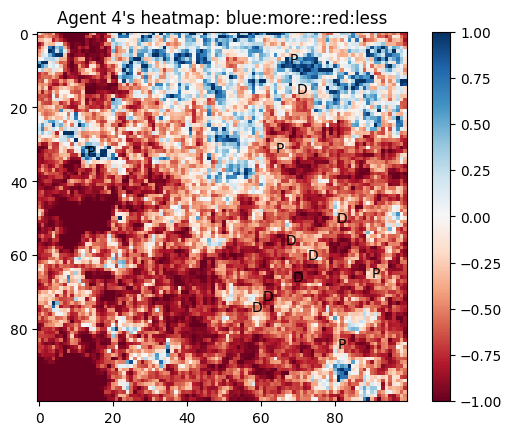

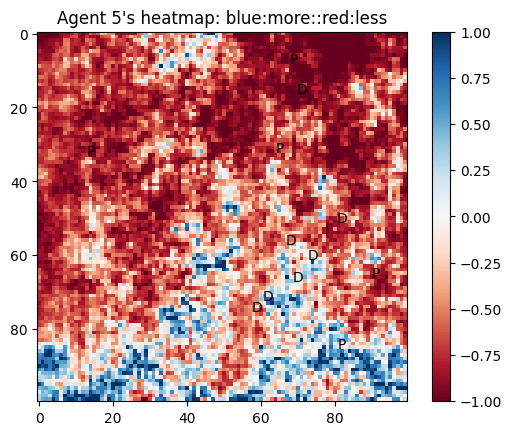

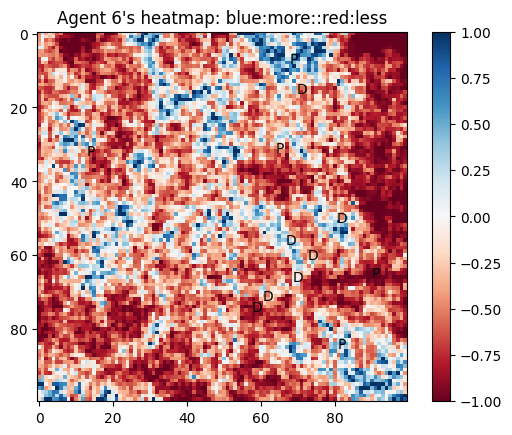

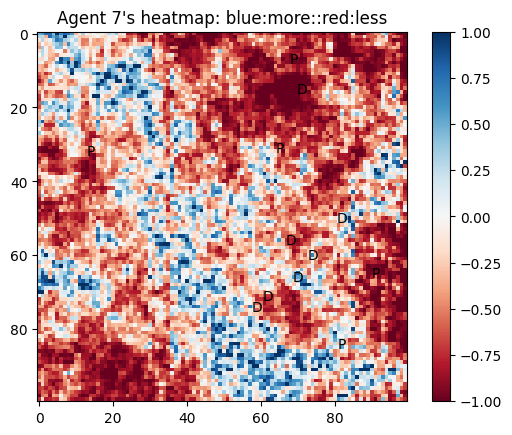

Cumulative for all agents:
White means a balance of agents who frequent the block and those that dont
Red means infrequently visited, Blue means visited much
Red will always occur where there is little reward to be found
Ideally, there will be Red with White, with minimal Blue on major shared pathways
Too much Blue indicates excessive agent overlap, ideally there are White attractive paths with Blue cores, or just a few Blue hotspots


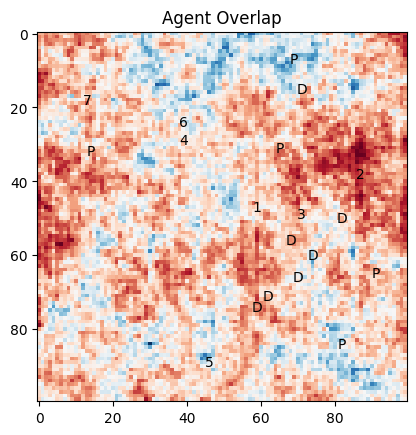

In [8]:
# Experiment 6, 200,000 steps pxploit with alpha = 0.1, gamma = 0.95, epsilon = 0.01, grid_size 100, num_agents 7
# Create an instance of PDWorld_env


#This will take awhile
# num_agents, grid_size, num_pickups, num_drops, num_blocks, alpha, gamma, epsilon
env_6 = PDWorld_env(7, 100, 5, 7, 11, 0.1, 0.95, 0.01)
# Reset the environment to initialize the state
# Set a fixed seed for reproducibility
env_6.set_rng_seed(777)
state = env_6.reset()

for step in range(200000):

    state = env_6.pxploit()
    # Check if the episode is done
    if env_6.is_done():
        print("Episode done at step", step + 1)
        break

show_block_locations(env_6)

show_start_pos(env_6)

viz_MVP_grid(env_6)
for i in range(env_6.num_agents):
    show_agent_grid(i, env_6)
    
show_agents_overlap(env_6)


# Ex7: I've added an optional cost for being within a certain manhattan distance of other agents, let's see what that does:
You turn it on by calling set_radius, first we try radius/cost 10/5
- Below is the code to use this reward in the env, commented out

In [9]:
# This is in the PD_World
# # Added optional reward for not being near another agent
#             radius = self.agent_radius  # set reward radius to 1/10th the grid size
#             # Going to use manhattan distance, so it's not really a radius
#             if(radius > 0):
#                 for j in range(self.num_agents):
#                     if( j != i):
#                         # if manhattan distance less than radius, negative reward
#                         if (abs(self.agents[i][0] - self.agents[j][0]) + abs(self.agents[i][1] - self.agents[j][1]) < radius):
#                             reward -= self.radius_cost

Agent Start (x,y): (47, 59)
Agent Start (x,y): (38, 87)
Agent Start (x,y): (49, 71)
Agent Start (x,y): (29, 39)
Agent Start (x,y): (89, 46)
Agent Start (x,y): (24, 39)
Agent Start (x,y): (18, 13)


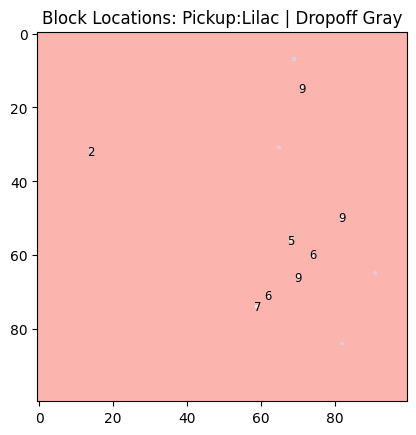

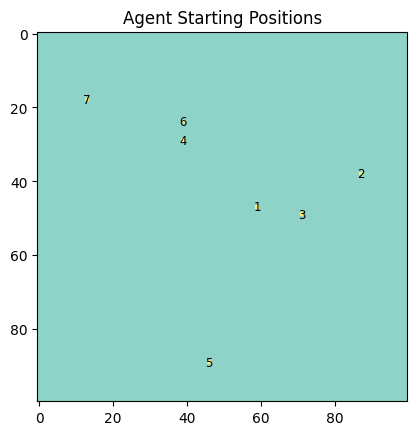

Avg cell value: 0: 0.6714
Avg cell value: 1: 0.7157
Avg cell value: 2: 0.7295
Avg cell value: 3: 0.7372
Avg cell value: 4: 0.7516
Avg cell value: 5: 0.7308
Avg cell value: 6: 0.7511
Black spaces indicate very little traffic in that cell for the agent


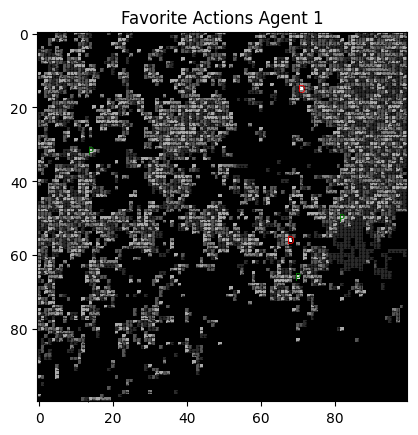

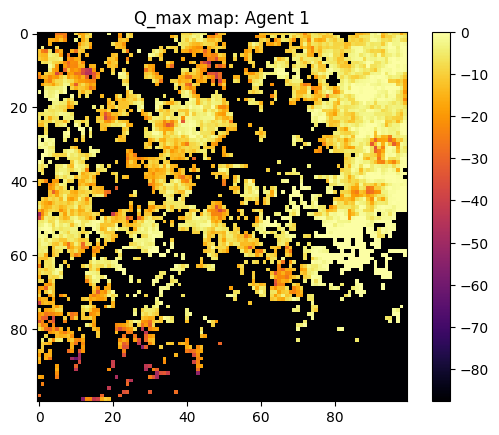

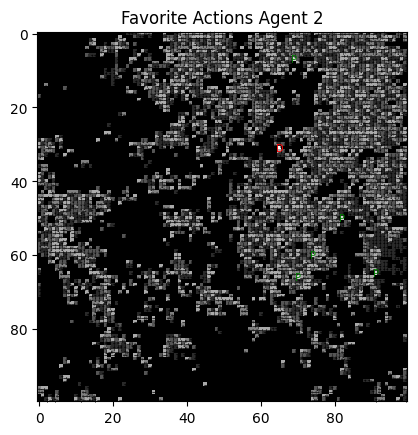

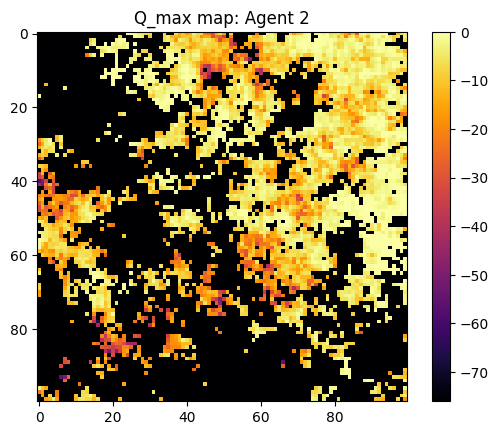

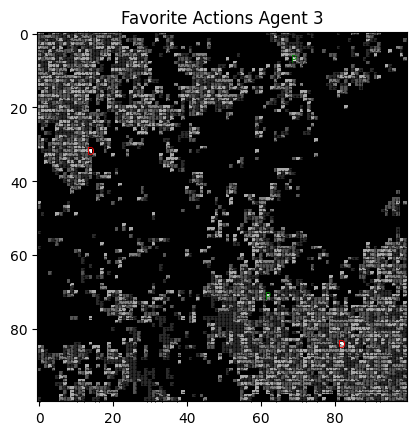

...

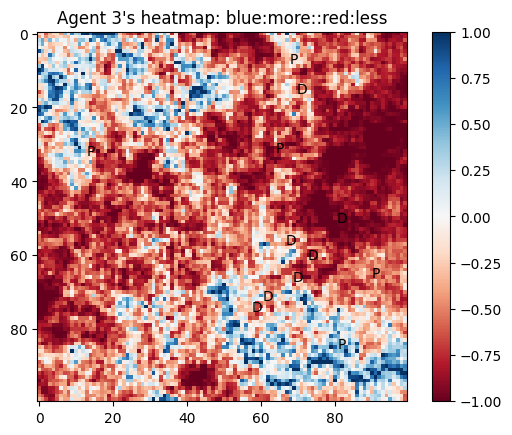

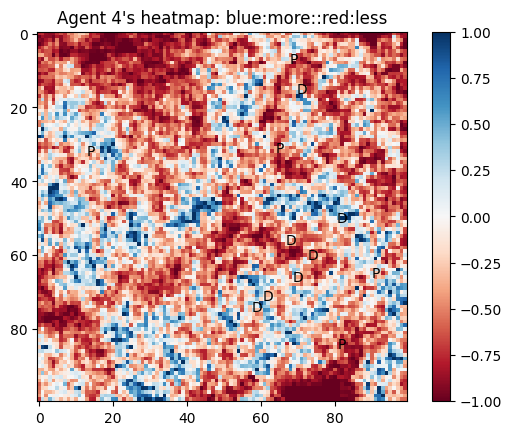

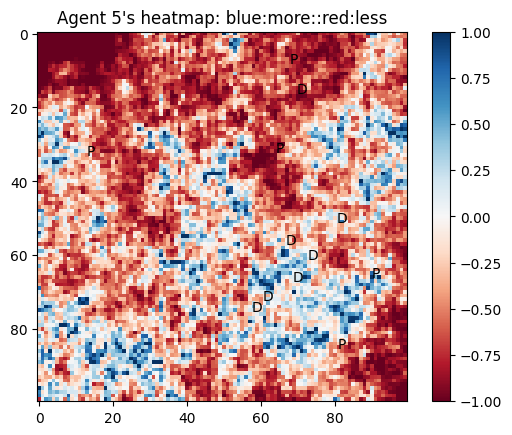

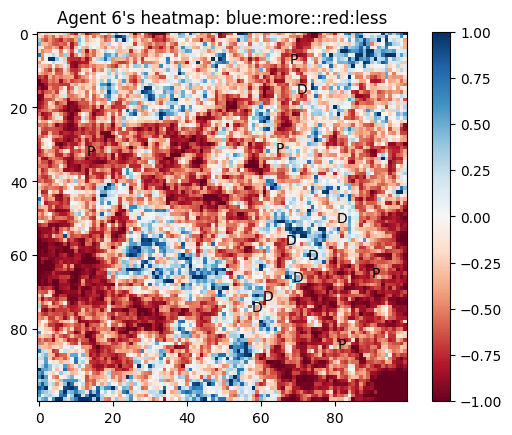

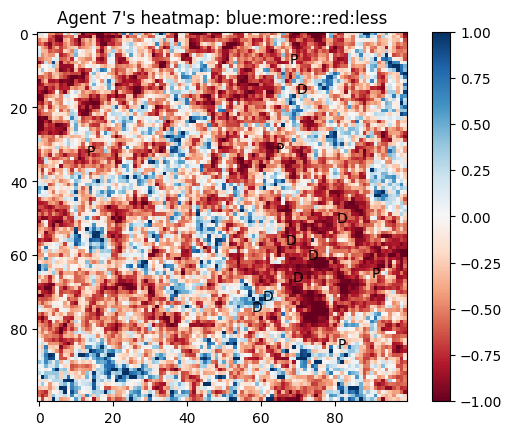

Cumulative for all agents:
White means a balance of agents who frequent the block and those that dont
Red means infrequently visited, Blue means visited much
Red will always occur where there is little reward to be found
Ideally, there will be Red with White, with minimal Blue on major shared pathways
Too much Blue indicates excessive agent overlap, ideally there are White attractive paths with Blue cores, or just a few Blue hotspots


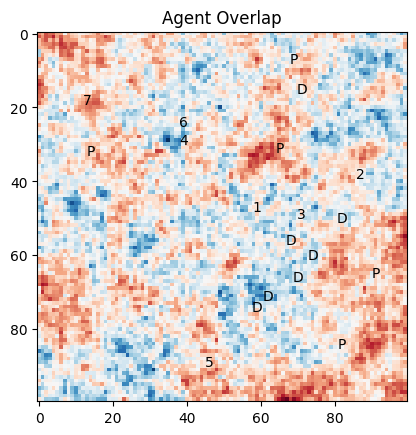

In [10]:
# Experiment 7, 200,000 steps pxploit 
# with alpha = 0.1, 
# gamma = 0.95, 
# epsilon = 0.01, 
# grid_size 100, 
# num_agents 7
# AND ADDED RADIUS/COST 10, 5 
# Create an instance of PDWorld_env


#This will take awhile
# num_agents, grid_size, num_pickups, num_drops, num_blocks, alpha, gamma, epsilon
env_7 = PDWorld_env(7, 100, 5, 7, 11, 0.1, 0.95, 0.01)
# Reset the environment to initialize the state
# Set a fixed seed for reproducibility
env_7.set_rng_seed(777)
state = env_7.reset()

#Set radius
env_7.set_radius(10, 5)

for step in range(200000):

    state = env_7.pxploit()
    # Check if the episode is done
    if env_7.is_done():
        print("Episode done at step", step + 1)
        break

show_block_locations(env_7)

show_start_pos(env_7)

viz_MVP_grid(env_7)
for i in range(env_7.num_agents):
    show_agent_grid(i, env_7)
    
show_agents_overlap(env_7)


# Ex8: Radius/Cost set to 20/5

Agent Start (x,y): (47, 59)
Agent Start (x,y): (38, 87)
Agent Start (x,y): (49, 71)
Agent Start (x,y): (29, 39)
Agent Start (x,y): (89, 46)
Agent Start (x,y): (24, 39)
Agent Start (x,y): (18, 13)


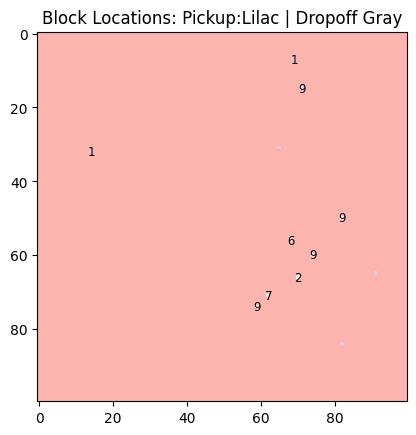

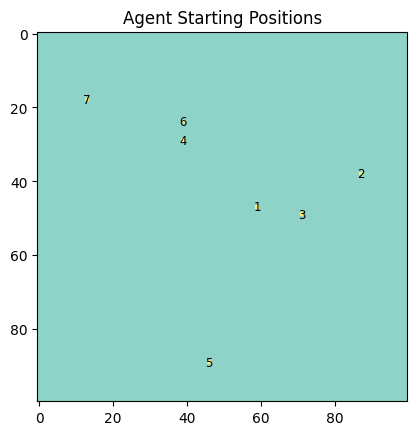

Avg cell value: 0: 0.7422
Avg cell value: 1: 0.741
Avg cell value: 2: 0.7461
Avg cell value: 3: 0.7326
Avg cell value: 4: 0.7418
Avg cell value: 5: 0.7322
Avg cell value: 6: 0.7518
Black spaces indicate very little traffic in that cell for the agent


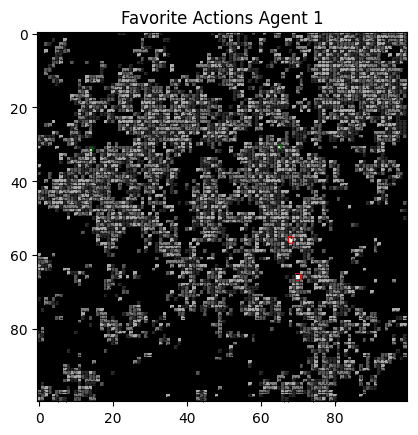

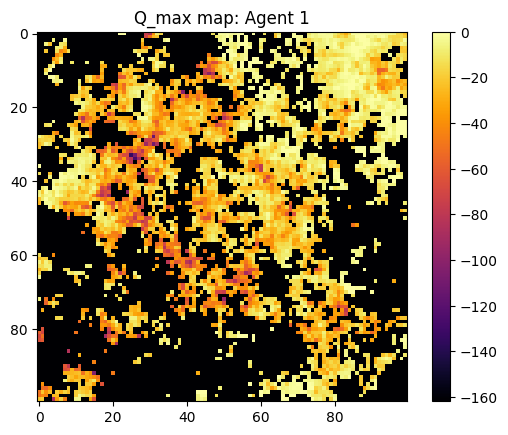

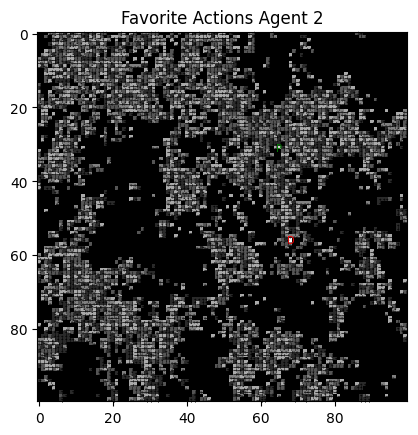

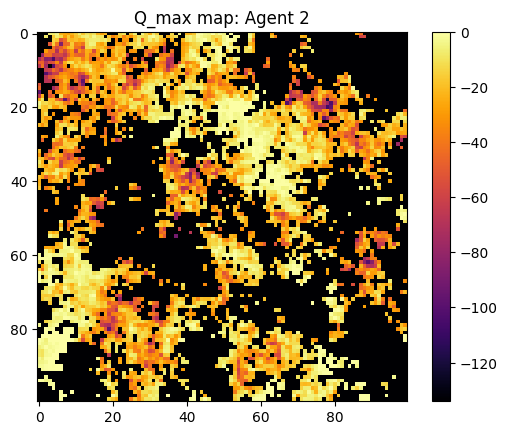

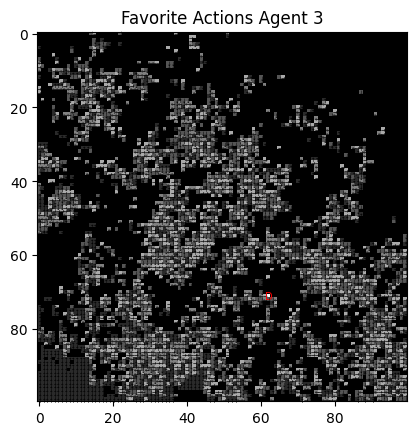

...

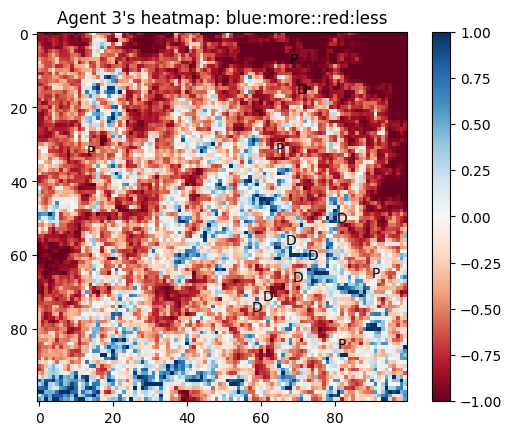

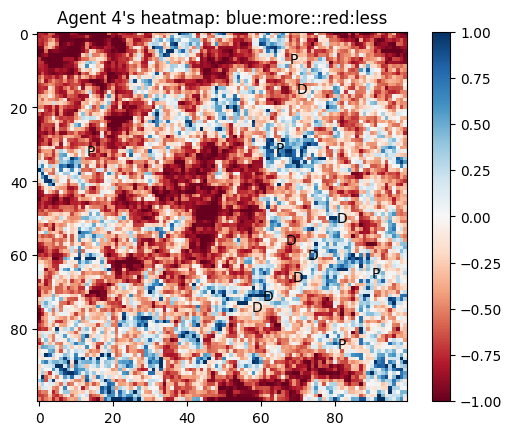

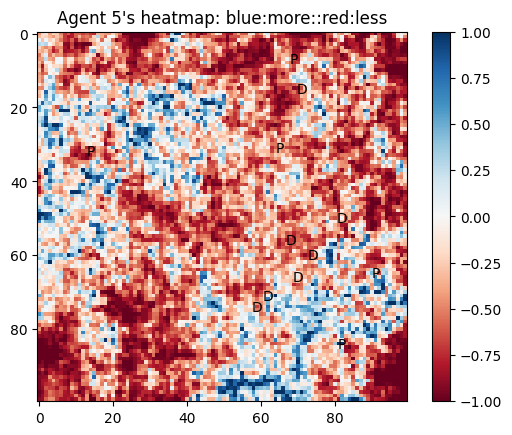

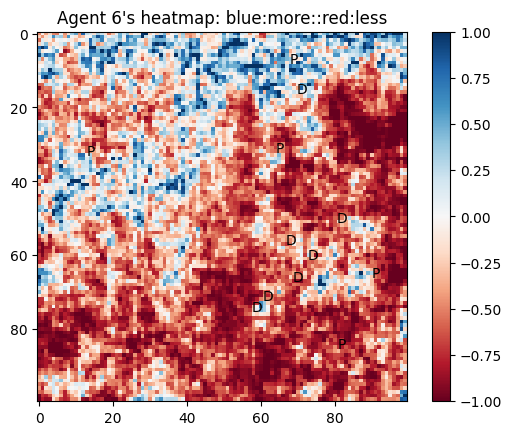

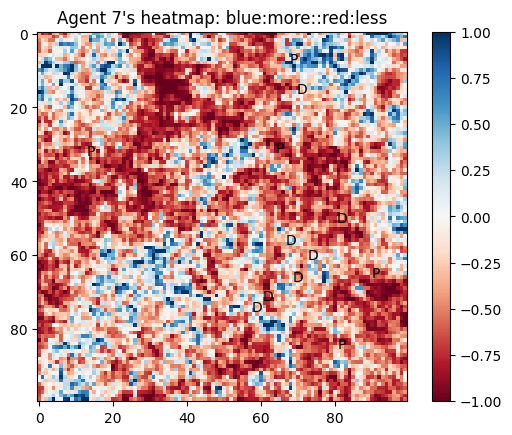

Cumulative for all agents:
White means a balance of agents who frequent the block and those that dont
Red means infrequently visited, Blue means visited much
Red will always occur where there is little reward to be found
Ideally, there will be Red with White, with minimal Blue on major shared pathways
Too much Blue indicates excessive agent overlap, ideally there are White attractive paths with Blue cores, or just a few Blue hotspots


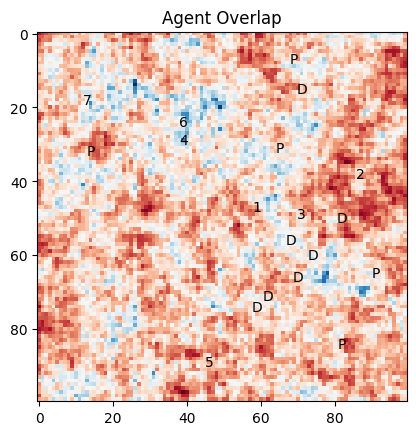

In [11]:
# Experiment 8, 200,000 steps pxploit with 
# alpha = 0.1, 
# gamma = 0.95, 
# epsilon = 0.01, 
# grid_size 100, 
# num_agents 7
# AND ADDED RADIUS/COST 20/5
# Create an instance of PDWorld_env


#This will take awhile
# num_agents, grid_size, num_pickups, num_drops, num_blocks, alpha, gamma, epsilon
env_8 = PDWorld_env(7, 100, 5, 7, 11, 0.1, 0.95, 0.01)
# Reset the environment to initialize the state
# Set a fixed seed for reproducibility
env_8.set_rng_seed(777)
state = env_8.reset()

#Set radius (20 instead of 10)
env_8.set_radius(20, 5)

for step in range(200000):
    
    state = env_8.pxploit()
    # Check if the episode is done
    if env_8.is_done():
        print("Episode done at step", step + 1)
        break

show_block_locations(env_8)

show_start_pos(env_8)

viz_MVP_grid(env_8)
for i in range(env_8.num_agents):
    show_agent_grid(i, env_8)
    
show_agents_overlap(env_8)


# Ex9: Radius/Cost set to 20/10

Agent Start (x,y): (47, 59)
Agent Start (x,y): (38, 87)
Agent Start (x,y): (49, 71)
Agent Start (x,y): (29, 39)
Agent Start (x,y): (89, 46)
Agent Start (x,y): (24, 39)
Agent Start (x,y): (18, 13)


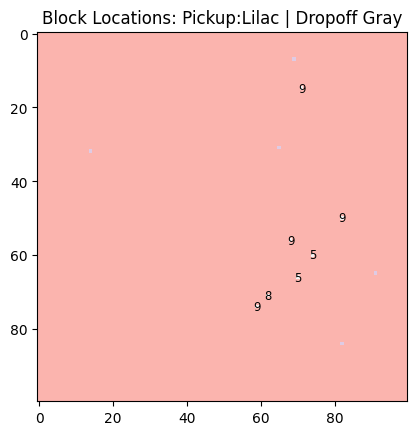

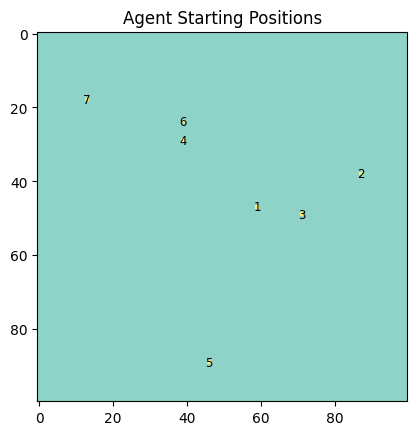

Avg cell value: 0: 0.7483
Avg cell value: 1: 0.735
Avg cell value: 2: 0.7318
Avg cell value: 3: 0.6858
Avg cell value: 4: 0.715
Avg cell value: 5: 0.6186
Avg cell value: 6: 0.7421
Black spaces indicate very little traffic in that cell for the agent


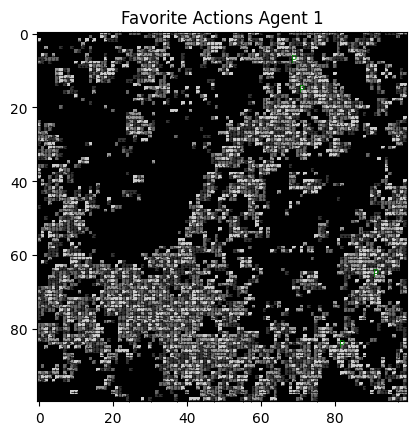

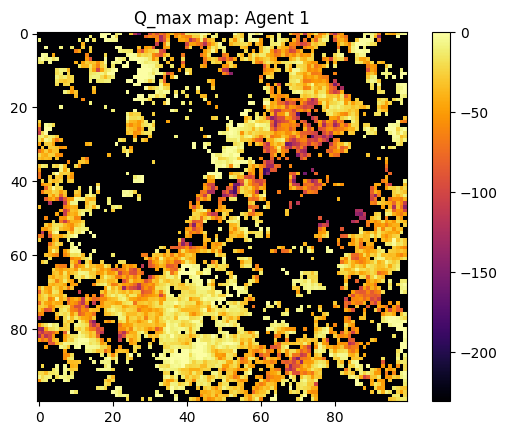

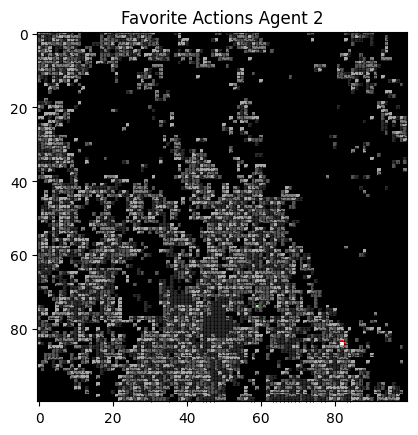

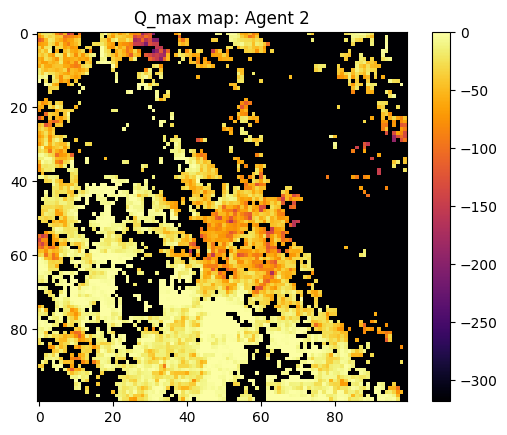

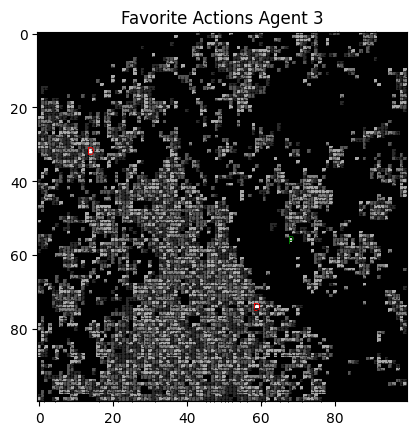

...

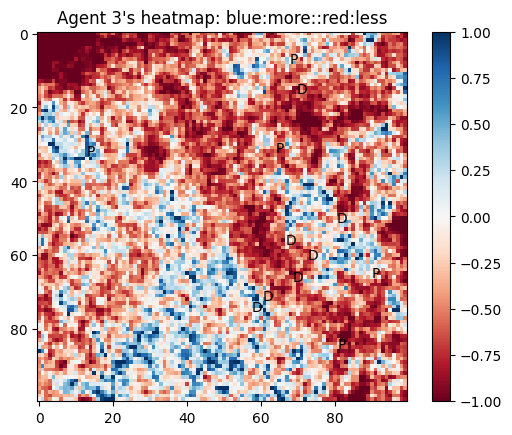

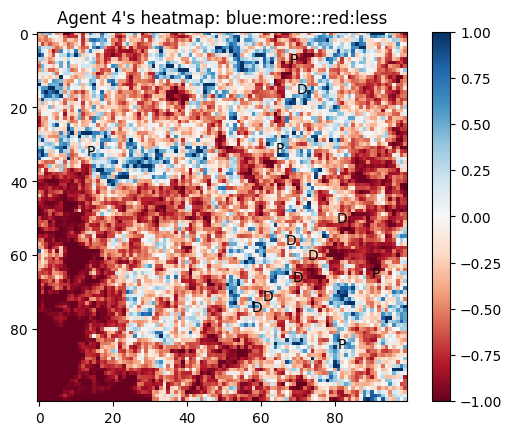

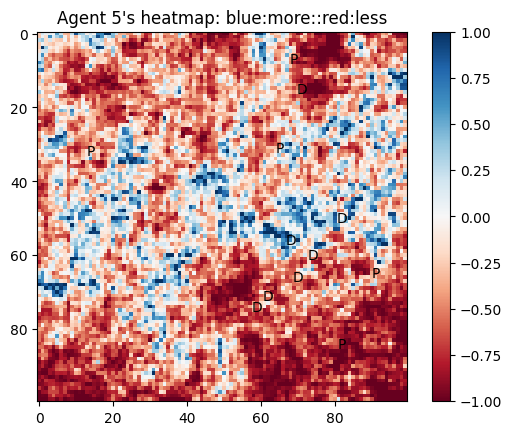

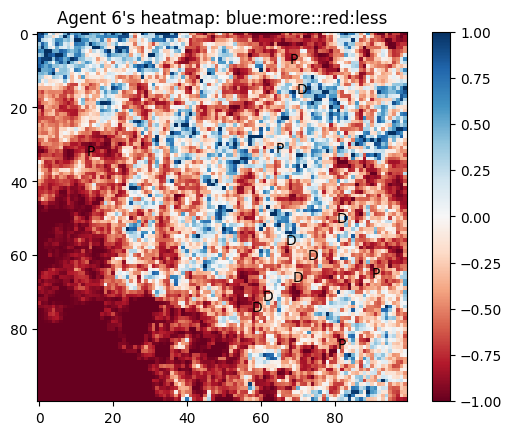

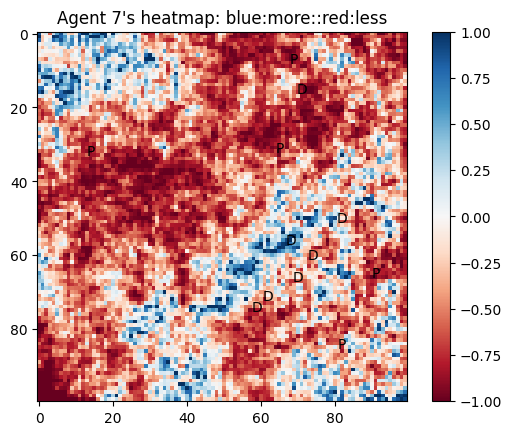

Cumulative for all agents:
White means a balance of agents who frequent the block and those that dont
Red means infrequently visited, Blue means visited much
Red will always occur where there is little reward to be found
Ideally, there will be Red with White, with minimal Blue on major shared pathways
Too much Blue indicates excessive agent overlap, ideally there are White attractive paths with Blue cores, or just a few Blue hotspots


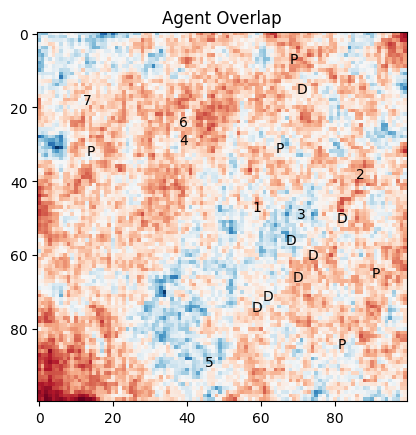

In [12]:
# Experiment 9, 200,000 steps pxploit with 
# alpha = 0.1, 
# gamma = 0.95, 
# epsilon = 0.01, 
# grid_size 100, 
# num_agents 7
# AND ADDED RADIUS COST, double radius from 7, double cost from 8
# Create an instance of PDWorld_env


# This will take awhile
# num_agents, grid_size, num_pickups, num_drops, num_blocks, alpha, gamma, epsilon
env_8 = PDWorld_env(7, 100, 5, 7, 11, 0.1, 0.95, 0.01)
# Reset the environment to initialize the state
# Set a fixed seed for reproducibility
env_8.set_rng_seed(777)
state = env_8.reset()

#Set radius (20 instead of 10)
#Cost is now 10, same as default pickup or dropoff
env_8.set_radius(20, 10)

for step in range(200000):
    
    state = env_8.pxploit()
    # Check if the episode is done
    if env_8.is_done():
        print("Episode done at step", step + 1)
        break

show_block_locations(env_8)

show_start_pos(env_8)

viz_MVP_grid(env_8)
for i in range(env_8.num_agents):
    show_agent_grid(i, env_8)
    
show_agents_overlap(env_8)
